___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

Welcome to "***Car Price Prediction Project***". This is the first medium project of ***Machine Learning*** course. In this project you will have the opportunity to apply many algorithms commonly used for regression problems.

Also, you will apply various processes such as pre-processing, ***train-test spilit*** and ***cross validation*** that you will use in algorithm modeling and prediction processes in Python with ***scikit-learn***.

Before diving into the project, please take a look at the determines and tasks.

- **NOTE:** This project assumes that you already know the basics of coding in Python. You should also be familiar with the theory behind regression algorithms and scikit-learn module as well as Machine Learning before you begin.


# #Determines

**Auto Scout** data which using for this project, scraped from the on-line car trading company(https://www.autoscout24.com), contains many features of different car models. In this project, you will use the data set which is already preprocessed and prepared for algorithms .

The aim of this project to understand of machine learning algorithms. Therefore, you will not need any EDA process as you will be working on the edited data.

---

In this Senario, you will estimate the prices of cars using regression algorithms.

While starting you should import the necessary modules and load the data given as pkl file. Also you'll need to do a few pre-processing before moving to modelling. After that you will implement ***Linear Regression, Ridge Regression, Lasso Regression,and Elastic-Net algorithms respectively*** (After completion of Unsupervised Learning section, you can also add bagging and boosting algorithms such as ***Random Forest and XG Boost*** this notebook to develop the project. You can measure the success of your models with regression evaluation metrics as well as with cross validation method.

For the better results, you should try to increase the success of your models by performing hyperparameter tuning. Determine feature importances for the model. You can set your model with the most important features for resource saving. You should try to apply this especially in Random Forest and XG Boost algorithms. Unlike the others, you will perform hyperparameter tuning for Random Forest and XG Boost using the ***GridSearchCV*** method.

Finally You can compare the performances of algorithms, work more on the algorithm have the most successful prediction rate.






# #Tasks

#### 1. Import Modules, Load Data and Data Review
#### 2. Data Pre-Processing
#### 3. Implement Linear Regression
#### 4. Implement Ridge Regression
#### 5. Implement Lasso Regression
#### 6. Implement Elastic-Net
#### 7. Visually Compare Models Performance In a Graph

## 1. Import Modules, Load Data and Data Review

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

from scipy.stats import skew

from sklearn.model_selection import cross_validate
import warnings
warnings.filterwarnings('ignore')
plt.rcParams["figure.figsize"] = (7,4)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 1000)
pd.options.display.float_format = '{:.3f}'.format

In [2]:
#!pip install -U scikit-learn

In [3]:
import numpy as np
np.__version__  # np version : 1.23.5

'1.26.4'

In [4]:
import sklearn
sklearn.__version__

'1.5.1'

In [5]:
df = pd.read_csv("Ready_to_ML.csv")

In [6]:
df.head()

,make_model,make,location,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
0,Mercedes-Benz A 160,Mercedes-Benz,"P.I. EL PALMAR C/FORJA 6, 11500 PUERTO DE SAN...",16950.000,Compact,Used,Yes,120200.000,Manual,Diesel,Dealer,1595.000,5.000,98.000,Front,Alloy wheels,1270.000,No,Cloth,2.000,efficient,6.000,75.000,3.800,Standard,Standard,Safety Premium Package
1,Mercedes-Benz EQE 350,Mercedes-Benz,"APARTADO DE CORREOS 1032, 26140 LOGROÑO, ES",80900.000,Compact,Pre-registered,Yes,5000.000,Automatic,Electric,Dealer,1.000,1.000,0.000,4WD,"Alloy wheels (21""), Shift paddles, Sport packa...",2355.000,No,Part/Full Leather,1.000,efficient,0.000,215.000,2.359,Premium,Plus,Safety Premium Package
2,Mercedes-Benz A 45 AMG,Mercedes-Benz,"PORT. TARRACO, MOLL DE LLEVANT, Nº 5, LOC. 6-8...",69900.000,Compact,Used,Yes,18900.000,Automatic,Benzine,Dealer,1991.000,8.000,162.000,4WD,Alloy wheels,1555.000,No,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400,Standard,Standard,Safety Premium Plus Package
3,Mercedes-Benz A 35 AMG,Mercedes-Benz,"Carrer de Provença, 31 Local, 8029 BARCELONA, ES",46990.000,Compact,Used,Yes,18995.000,Automatic,Benzine,Dealer,1991.000,7.000,169.000,4WD,Sport seats,1455.000,No,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300,Standard,Standard,Safety Premium Package
4,Mercedes-Benz A 45 AMG,Mercedes-Benz,"CARRIL ARAGONES 4, 30007 CASILLAS, ES",16800.000,Compact,Used,Yes,197000.000,Automatic,Diesel,Dealer,2143.000,7.000,162.000,4WD,Alloy wheels,1545.000,No,Part/Full Leather,2.000,unefficient,7.000,100.000,4.900,Standard,Standard,Safety Premium Plus Package


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26711 entries, 0 to 26710
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   make_model                     26711 non-null  object 
 1   make                           26711 non-null  object 
 2   location                       26711 non-null  object 
 3   price                          26711 non-null  float64
 4   body_type                      26711 non-null  object 
 5   type                           26711 non-null  object 
 6   warranty                       26711 non-null  object 
 7   mileage                        26711 non-null  float64
 8   gearbox                        26711 non-null  object 
 9   fuel_type                      26711 non-null  object 
 10  seller                         26711 non-null  object 
 11  engine_size                    26711 non-null  float64
 12  gears                          26711 non-null 

In [8]:
df.describe()

,price,mileage,engine_size,gears,co_emissions,empty_weight,previous_owner,age,power_kW,cons_avg
count,26711.000,26711.000,26711.000,26711.000,26711.000,26711.000,26711.000,26711.000,26711.000,26711.000
mean,23537.241,68863.812,1708.965,5.820,129.526,1425.205,1.460,5.166,118.414,5.532
std,20811.986,62794.146,772.440,1.417,54.255,307.387,0.853,4.655,65.642,2.220
min,490.000,0.000,0.000,1.000,0.000,347.000,1.000,0.000,33.000,0.000
25%,12490.000,19155.000,1248.000,5.000,105.000,1228.000,1.000,2.000,80.000,4.300
50%,18440.000,54000.000,1595.000,6.000,123.000,1375.000,1.000,4.000,100.000,5.200
75%,28330.000,100675.000,1969.000,6.000,150.000,1597.000,2.000,7.000,135.000,6.400
max,549000.000,667128.000,6300.000,8.000,399.000,3150.000,9.000,20.000,450.000,18.300


In [9]:
df.duplicated().sum()

1815

In [10]:
df.drop_duplicates(inplace=True)

In [11]:
df.duplicated().sum()

0

In [12]:
df.make_model.value_counts()

# In order for ML models to learn a data well, the data should contain all the details as possible.
# When we look at the number of brand models, we see that the number of models of some brands is very low.
# In order for ML models to accurately predict car prices on a brand-by-model basis,
# there must be enough observations from each brand and model. For this, we exclude brand models under 100 from our data.

make_model
Renault Megane              825
SEAT Leon                   757
Dacia Sandero               721
Hyundai i30                 699
Opel Astra                  634
Ford Mustang                572
Peugeot 308                 536
Nissan Qashqai              484
Ford Focus                  483
SEAT Ibiza                  433
Volvo V40                   430
Fiat Tipo                   415
Fiat 500                    413
Renault Clio                404
Ford Fiesta                 392
Nissan Micra                380
Fiat 500X                   373
Skoda Octavia               359
Opel Corsa                  358
Dacia Duster                343
Toyota Yaris                323
Opel Insignia               290
Volvo C70                   281
Peugeot 208                 260
Skoda Fabia                 246
Fiat 500C                   238
Toyota Auris                231
Peugeot RCZ                 220
Hyundai TUCSON              216
Peugeot 3008                215
Ford Kuga                   2

In [13]:
df.make_model.unique()

array(['Mercedes-Benz A 160', 'Mercedes-Benz EQE 350',
       'Mercedes-Benz A 45 AMG', 'Mercedes-Benz A 35 AMG',
       'Mercedes-Benz C 160', 'Mercedes-Benz CLA 180',
       'Mercedes-Benz A 220', 'Mercedes-Benz A 200',
       'Mercedes-Benz A 250', 'Mercedes-Benz A 180',
       'Mercedes-Benz GLC 220', 'Mercedes-Benz E 220',
       'Mercedes-Benz B 200', 'Mercedes-Benz A 150',
       'Mercedes-Benz V 220', 'Mercedes-Benz AMG GT', 'Mercedes-Benz EQS',
       'Mercedes-Benz A 140', 'Mercedes-Benz CL', 'Mercedes-Benz B 180',
       'Mercedes-Benz GLB 200', 'Mercedes-Benz E 350',
       'Mercedes-Benz CLA 200', 'Mercedes-Benz GLA 180',
       'Mercedes-Benz Viano', 'Mercedes-Benz E 53 AMG',
       'Mercedes-Benz SLK 200', 'Mercedes-Benz GLE 350',
       'Mercedes-Benz 220', 'Mercedes-Benz E 400',
       'Mercedes-Benz SLC 43 AMG', 'Mercedes-Benz SL 350',
       'Mercedes-Benz SLC 250', 'Mercedes-Benz SLK 350',
       'Mercedes-Benz SLS', 'Mercedes-Benz CLK 200',
       'Mercedes-Benz C 

In [14]:
drop_model = df.make_model.value_counts()[df.make_model.value_counts() <= 19].index
drop_model

# We list the models with 100 or less observations.
# We will drop the observations of the models in this list from our data.

Index(['Opel Karl', 'Toyota Verso', 'Nissan Navara', 'Ford Mustang Mach-E',
       'Mercedes-Benz S 63 AMG', 'Volvo S80', 'Peugeot Rifter',
       'Mercedes-Benz S 350', 'Skoda Yeti', 'Mercedes-Benz GLE 400',
       ...
       'Mercedes-Benz ML 300', 'Dacia Break', 'Toyota Tundra',
       'Mercedes-Benz E 50 AMG', 'Mercedes-Benz CLS 300',
       'Mercedes-Benz S 65 AMG', 'Mercedes-Benz CLK 320', 'Toyota GR86',
       'Toyota Tacoma', 'Renault R 11'],
      dtype='object', name='make_model', length=316)

In [15]:
for i in drop_model:
    drop_index = df[df['make_model'] == i].index
    df.drop(index = drop_index, inplace=True)

df.reset_index(drop=True, inplace=True)

# We pull all the models in the model list in order and find the indexes of the observations of these models first.
# We drop the indexes we find from our data every time.
# Since the deleted indexes in the last stage will not appear in our data, we reset the indexes starting from 0.

In [16]:
df

,make_model,make,location,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
0,Mercedes-Benz A 45 AMG,Mercedes-Benz,"PORT. TARRACO, MOLL DE LLEVANT, Nº 5, LOC. 6-8...",69900.000,Compact,Used,Yes,18900.000,Automatic,Benzine,Dealer,1991.000,8.000,162.000,4WD,Alloy wheels,1555.000,No,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400,Standard,Standard,Safety Premium Plus Package
1,Mercedes-Benz A 35 AMG,Mercedes-Benz,"Carrer de Provença, 31 Local, 8029 BARCELONA, ES",46990.000,Compact,Used,Yes,18995.000,Automatic,Benzine,Dealer,1991.000,7.000,169.000,4WD,Sport seats,1455.000,No,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300,Standard,Standard,Safety Premium Package
2,Mercedes-Benz A 45 AMG,Mercedes-Benz,"CARRIL ARAGONES 4, 30007 CASILLAS, ES",16800.000,Compact,Used,Yes,197000.000,Automatic,Diesel,Dealer,2143.000,7.000,162.000,4WD,Alloy wheels,1545.000,No,Part/Full Leather,2.000,unefficient,7.000,100.000,4.900,Standard,Standard,Safety Premium Plus Package
3,Mercedes-Benz CLA 180,Mercedes-Benz,"CR PATERNA-LA CAÑADA, KM. 2, 46980 PATERNA, ES",22550.000,Compact,Used,Yes,83339.000,Manual,Diesel,Dealer,1595.000,7.000,134.000,Front,"Alloy wheels (17""), Shift paddles, Sport seats",1410.000,No,Part/Full Leather,3.000,unefficient,4.000,90.000,6.100,Standard,Plus,Safety Premium Package
4,Mercedes-Benz A 220,Mercedes-Benz,"CTRA DE MADRID KM 315,7, 50012 ZARAGOZA, ES",26900.000,Compact,Used,Yes,48900.000,Automatic,Benzine,Dealer,1991.000,7.000,141.000,Front,"Alloy wheels, Sport seats",1450.000,No,Part/Full Leather,2.000,efficient,3.000,140.000,6.100,Standard,Standard,Safety Premium Package
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23229,Volvo V40,Volvo,"1000 Brussel, BE",13000.000,Sedan,Used,No,114000.000,Manual,Diesel,Private seller,1969.000,6.000,94.000,Front,"All season tyres, Ambient lighting, Cargo barr...",1532.000,Yes,Cloth,1.000,efficient,4.000,88.000,3.600,Standard,Standard,Safety Premium Package
23230,Volvo S60,Volvo,"CALLE CATALUNYA, 37, 8520 LLERONA, ES",4999.000,Sedan,Used,Yes,166512.000,Manual,Benzine,Dealer,2521.000,5.000,145.000,Front,Alloy wheels,1550.000,No,Part/Full Leather,3.000,efficient,18.000,154.000,9.100,Standard,Standard,Safety Premium Package
23231,Volvo S90,Volvo,"HERMANOS LUMIERE Nº16, 29004 MALAGA, ES",37600.000,Sedan,Used,Yes,40345.000,Automatic,Diesel,Dealer,1969.000,8.000,127.000,4WD,Alloy wheels,2077.000,No,Part/Full Leather,2.000,efficient,3.000,288.000,2.000,Standard,Standard,Safety Premium Plus Package
23232,Volvo C30,Volvo,"Sur rendez-vous, 5060 Sambreville, BE",7300.000,Sedan,Used,Yes,96000.000,Manual,Diesel,Dealer,1560.000,6.000,99.000,Front,"Alloy wheels, Automatically dimming interior m...",1356.000,Yes,Cloth,1.000,unefficient,11.000,84.000,3.800,Standard,Standard,Safety Premium Package


In [17]:
df.make_model.value_counts()

# We saw that models with less than 100 observations were dropped.

make_model
Renault Megane              825
SEAT Leon                   757
Dacia Sandero               721
Hyundai i30                 699
Opel Astra                  634
Ford Mustang                572
Peugeot 308                 536
Nissan Qashqai              484
Ford Focus                  483
SEAT Ibiza                  433
Volvo V40                   430
Fiat Tipo                   415
Fiat 500                    413
Renault Clio                404
Ford Fiesta                 392
Nissan Micra                380
Fiat 500X                   373
Skoda Octavia               359
Opel Corsa                  358
Dacia Duster                343
Toyota Yaris                323
Opel Insignia               290
Volvo C70                   281
Peugeot 208                 260
Skoda Fabia                 246
Fiat 500C                   238
Toyota Auris                231
Peugeot RCZ                 220
Hyundai TUCSON              216
Peugeot 3008                215
Ford Kuga                   2

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23234 entries, 0 to 23233
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   make_model                     23234 non-null  object 
 1   make                           23234 non-null  object 
 2   location                       23234 non-null  object 
 3   price                          23234 non-null  float64
 4   body_type                      23234 non-null  object 
 5   type                           23234 non-null  object 
 6   warranty                       23234 non-null  object 
 7   mileage                        23234 non-null  float64
 8   gearbox                        23234 non-null  object 
 9   fuel_type                      23234 non-null  object 
 10  seller                         23234 non-null  object 
 11  engine_size                    23234 non-null  float64
 12  gears                          23234 non-null 

## Feature Engineering

In [19]:
df.head(2)

,make_model,make,location,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
0,Mercedes-Benz A 45 AMG,Mercedes-Benz,"PORT. TARRACO, MOLL DE LLEVANT, Nº 5, LOC. 6-8...",69900.000,Compact,Used,Yes,18900.000,Automatic,Benzine,Dealer,1991.000,8.000,162.000,4WD,Alloy wheels,1555.000,No,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400,Standard,Standard,Safety Premium Plus Package
1,Mercedes-Benz A 35 AMG,Mercedes-Benz,"Carrer de Provença, 31 Local, 8029 BARCELONA, ES",46990.000,Compact,Used,Yes,18995.000,Automatic,Benzine,Dealer,1991.000,7.000,169.000,4WD,Sport seats,1455.000,No,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300,Standard,Standard,Safety Premium Package


In [20]:
df.drop(columns=["make", "location"], inplace=True)

# make_model feature already gives us insight about make feature so we drop make feature.
# We are dropping the location feature because we don't think it will have an effect on prices.

In [21]:
df.head(2)

,make_model,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
0,Mercedes-Benz A 45 AMG,69900.000,Compact,Used,Yes,18900.000,Automatic,Benzine,Dealer,1991.000,8.000,162.000,4WD,Alloy wheels,1555.000,No,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400,Standard,Standard,Safety Premium Plus Package
1,Mercedes-Benz A 35 AMG,46990.000,Compact,Used,Yes,18995.000,Automatic,Benzine,Dealer,1991.000,7.000,169.000,4WD,Sport seats,1455.000,No,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300,Standard,Standard,Safety Premium Package


In [22]:
df_object = df.select_dtypes(include ="object").head()
df_object

# select_dtypes(include ="object") to filter only object type features

,make_model,body_type,type,warranty,gearbox,fuel_type,seller,drivetrain,extras,full_service_history,upholstery,energy_efficiency_class,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
0,Mercedes-Benz A 45 AMG,Compact,Used,Yes,Automatic,Benzine,Dealer,4WD,Alloy wheels,No,Part/Full Leather,unefficient,Standard,Standard,Safety Premium Plus Package
1,Mercedes-Benz A 35 AMG,Compact,Used,Yes,Automatic,Benzine,Dealer,4WD,Sport seats,No,Part/Full Leather,unefficient,Standard,Standard,Safety Premium Package
2,Mercedes-Benz A 45 AMG,Compact,Used,Yes,Automatic,Diesel,Dealer,4WD,Alloy wheels,No,Part/Full Leather,unefficient,Standard,Standard,Safety Premium Plus Package
3,Mercedes-Benz CLA 180,Compact,Used,Yes,Manual,Diesel,Dealer,Front,"Alloy wheels (17""), Shift paddles, Sport seats",No,Part/Full Leather,unefficient,Standard,Plus,Safety Premium Package
4,Mercedes-Benz A 220,Compact,Used,Yes,Automatic,Benzine,Dealer,Front,"Alloy wheels, Sport seats",No,Part/Full Leather,efficient,Standard,Standard,Safety Premium Package


In [23]:
for col in df_object:
    print(f"{col:<30}:", df[col].nunique())

# we see how many unique observations each feature consists of.

# With <30, a 30-character space is left from the leftmost to the ":" sign and feature names are printed in this space.
# The ":" sign is aligned on all lines.

make_model                    : 174
body_type                     : 6
type                          : 4
warranty                      : 2
gearbox                       : 3
fuel_type                     : 4
seller                        : 2
drivetrain                    : 3
extras                        : 8277
full_service_history          : 2
upholstery                    : 2
energy_efficiency_class       : 2
comfort_&_convenience_Package : 3
entertainment_&_media_Package : 2
safety_&_security_Package     : 3


### Converting the Extras feature from object to numeric

In [24]:
df.extras.sample(10)

# Since we want our ML Model to give more weight to cars with more features,
# we will count the features here and assign the numbers we find
# to the places of the categorical observations here.

11477                       Alloy wheels, Sport suspension
17912    Alloy wheels (18"), Automatically dimming inte...
20382                                         Alloy wheels
20664    Alloy wheels, Catalytic Converter, Roof rack, ...
20388    Alloy wheels, Ambient lighting, Cargo barrier,...
15872                                         Alloy wheels
18805    Alloy wheels (17"), Ambient lighting, Automati...
10518    Alloy wheels (17"), Automatically dimming inte...
12758    Alloy wheels, Automatically dimming interior m...
2255     Alloy wheels, Ambient lighting, Automatically ...
Name: extras, dtype: object

In [25]:
df.extras.apply(lambda x: len(x.split(',')))

0        1
1        1
2        1
3        3
4        2
        ..
23229    9
23230    1
23231    1
23232    3
23233    2
Name: extras, Length: 23234, dtype: int64

In [26]:
df["extras"] = df.extras.apply(lambda x: len(x.split(',')))

# We assign these numbers we find to the relevant feat.

In [27]:
df.head() # check extras feature turned into numeric

,make_model,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
0,Mercedes-Benz A 45 AMG,69900.000,Compact,Used,Yes,18900.000,Automatic,Benzine,Dealer,1991.000,8.000,162.000,4WD,1,1555.000,No,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400,Standard,Standard,Safety Premium Plus Package
1,Mercedes-Benz A 35 AMG,46990.000,Compact,Used,Yes,18995.000,Automatic,Benzine,Dealer,1991.000,7.000,169.000,4WD,1,1455.000,No,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300,Standard,Standard,Safety Premium Package
2,Mercedes-Benz A 45 AMG,16800.000,Compact,Used,Yes,197000.000,Automatic,Diesel,Dealer,2143.000,7.000,162.000,4WD,1,1545.000,No,Part/Full Leather,2.000,unefficient,7.000,100.000,4.900,Standard,Standard,Safety Premium Plus Package
3,Mercedes-Benz CLA 180,22550.000,Compact,Used,Yes,83339.000,Manual,Diesel,Dealer,1595.000,7.000,134.000,Front,3,1410.000,No,Part/Full Leather,3.000,unefficient,4.000,90.000,6.100,Standard,Plus,Safety Premium Package
4,Mercedes-Benz A 220,26900.000,Compact,Used,Yes,48900.000,Automatic,Benzine,Dealer,1991.000,7.000,141.000,Front,2,1450.000,No,Part/Full Leather,2.000,efficient,3.000,140.000,6.100,Standard,Standard,Safety Premium Package


In [28]:
df.extras.nunique() # 6478 unique value --> reduced to 21 unique.

21

In [29]:
df.extras.unique()

array([ 1,  3,  2,  5,  6, 11,  8,  9,  7, 10,  4, 12, 17, 15, 13, 14, 19,
       16, 18, 26, 20], dtype=int64)

In [30]:
for i in df.select_dtypes("object"):
    print(f"{i:<30}:", df[i].unique())

# When we examine these lists, type, comfort_&_convenience_Package, entertainment_&_media_Package,
# safety_&_security_Package features ordinalencoder other We see that we will apply
# onehotencoder transformation to featurs.

# OneHotEncoder:
# OneHotEncoder converts categorical features into dummies 0 and 1.
# If we want our model to treat all unique values under the categorical feature equally,
# we convert our categorical data to 0 and 1 using the onehotencoder conversion algorithm.

# OrdinalEncoder:
# if unique categorical data under a featurea have a hierarchical advantage over
# each other (good, bad, very bad or cheap, average, expensive, very expensive) etc.
# If we want the model to treat all observations according to their superiority,
# that is, not to treat them equally, we use the ordianlencoder conversion algorithm.

make_model                    : ['Mercedes-Benz A 45 AMG' 'Mercedes-Benz A 35 AMG' 'Mercedes-Benz CLA 180'
 'Mercedes-Benz A 220' 'Mercedes-Benz A 200' 'Mercedes-Benz A 250'
 'Mercedes-Benz A 180' 'Mercedes-Benz GLC 220' 'Mercedes-Benz E 220'
 'Mercedes-Benz AMG GT' 'Mercedes-Benz EQS' 'Mercedes-Benz CL'
 'Mercedes-Benz E 350' 'Mercedes-Benz CLA 200' 'Mercedes-Benz E 53 AMG'
 'Mercedes-Benz SLK 200' 'Mercedes-Benz E 400' 'Mercedes-Benz C 400'
 'Mercedes-Benz C 43 AMG' 'Mercedes-Benz C 63 AMG' 'Mercedes-Benz C 300'
 'Mercedes-Benz E 300' 'Mercedes-Benz C 200' 'Mercedes-Benz E 200'
 'Mercedes-Benz C 180' 'Mercedes-Benz C 250' 'Mercedes-Benz C 220'
 'Mercedes-Benz E 250' 'Mercedes-Benz S 500' 'Mercedes-Benz CLA 45 AMG'
 'Mercedes-Benz CLS 350' 'Mercedes-Benz GLC 43 AMG'
 'Mercedes-Benz GLC 63 AMG' 'Mercedes-Benz GLC 250'
 'Mercedes-Benz GLC 300' 'Mercedes-Benz E 63 AMG' 'Opel Corsa'
 'Opel Astra' 'Opel Adam' 'Opel Insignia' 'Opel GT' 'Opel Cascada'
 'Opel Tigra' 'Opel Crossland X' 'Opel G

In [31]:
#!pip install matplotlib==3.4

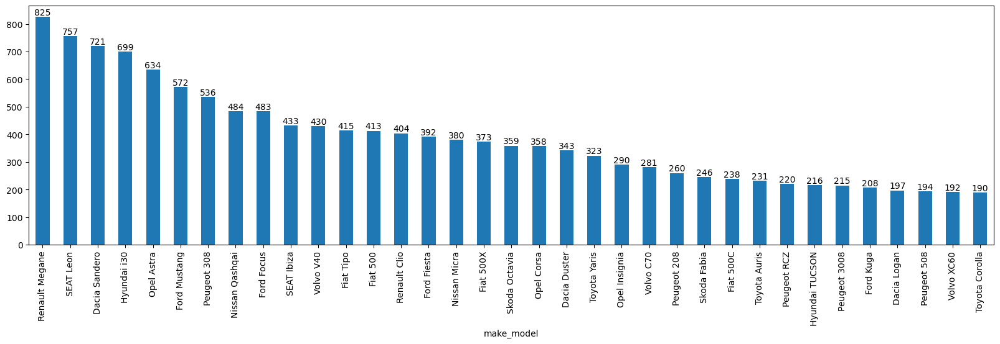

In [32]:
ax = df.make_model.value_counts().iloc[:35].plot(kind ="bar", figsize=(20,5))

ax.bar_label(ax.containers[0]);

# we see the top 35 models with the most observations in our data and their numbers.

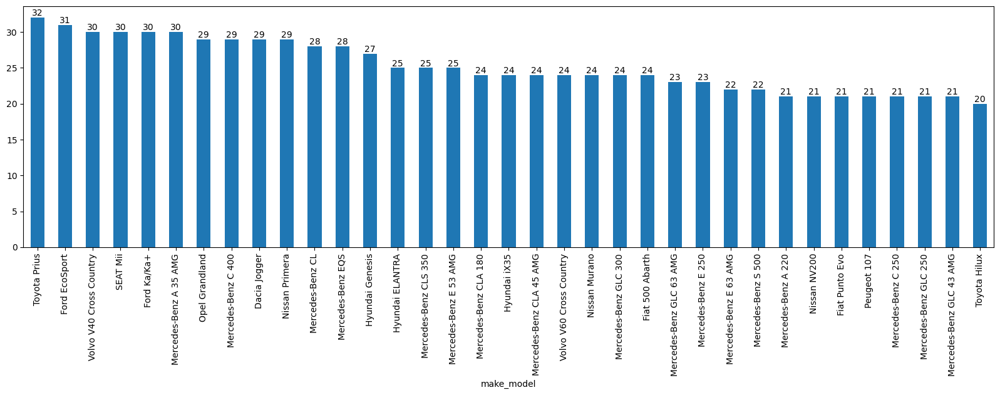

In [33]:
ax = df.make_model.value_counts().iloc[-35:].plot(kind ="bar", figsize=(20,5))

ax.bar_label(ax.containers[0]);

# we see 35 models and numbers with the least observations in our data.

In [34]:
df2 = df.copy()

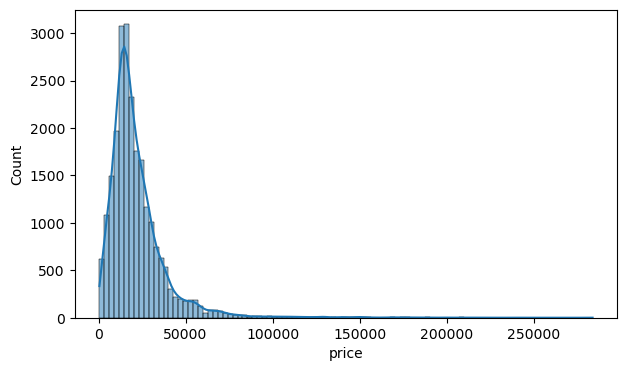

In [35]:
sns.histplot(df.price, bins=100, kde=True);

# Since linear models are very sensitive to outliers, I am trying to detect outliers in the data with histplot.
# Let's not forget that outlier for ML means that the data of a group or groups in our data is insufficient for training.
# By looking at the image below, we see that the number of vehicles over 70.000 EURO is very low.
# Based on this image, we can evaluate that the number of vehicles over 70 thousand EURO may be insufficient for training.
# However, we cannot understand whether it is inadequate or not without training.
# We should decide by both dropping the observations that we consider as outliers and
# comparing the scores by doing the training without dropping them.

# Also, looking at the histplot for all the data may mislead us about the outlier.
# For outlier detection, we should group the data in our data (Opel Astra, Ford Fiesta, Volvo S60 etc.)
# and determine the outlier accordingly.

In [36]:
skew(df.price)

3.739248483619921

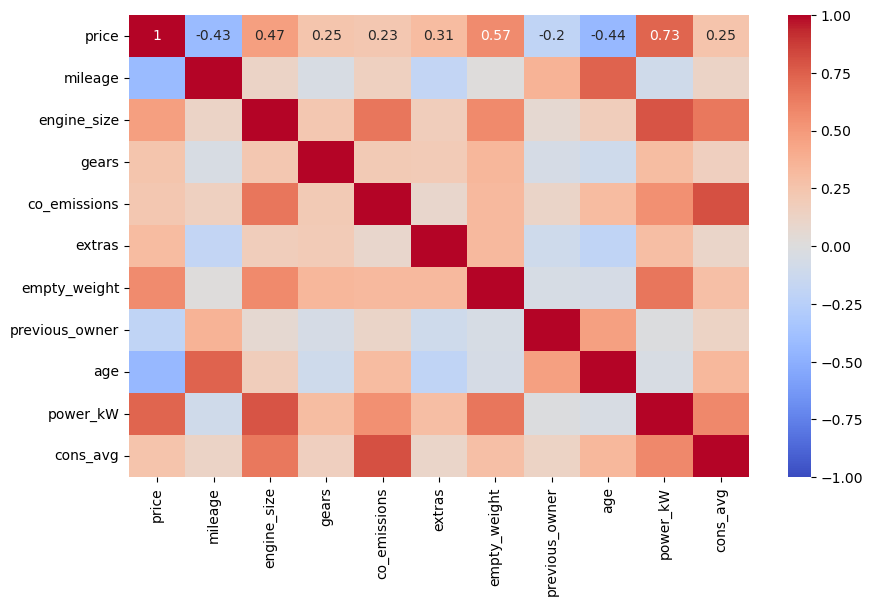

In [37]:
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(numeric_only=True), vmin=-1, vmax=1, annot =True, cmap="coolwarm");

## multicollinearity control

In [38]:
df.corr(numeric_only=True)[(abs(df.corr(numeric_only=True))>= 0.9) & (abs(df.corr(numeric_only=True)) < 1)] .any().any()

# Corr between +/-0.9 and +/-1. We can check multicollinearity for values with this snippet.

False

### VIF (Variance Inflation Factor) Score for Multicolliniearity

In [39]:
# conda install -c anaconda statsmodels
# !pip install statsmodels

In [40]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [41]:
df_numeric = df.select_dtypes(include ="number")
X_vif = df_numeric.drop(columns='price')
X_vif.head()

,mileage,engine_size,gears,co_emissions,extras,empty_weight,previous_owner,age,power_kW,cons_avg
0,18900.000,1991.000,8.000,162.000,1,1555.000,2.000,2.000,310.000,8.400
1,18995.000,1991.000,7.000,169.000,1,1455.000,2.000,2.000,225.000,7.300
2,197000.000,2143.000,7.000,162.000,1,1545.000,2.000,7.000,100.000,4.900
3,83339.000,1595.000,7.000,134.000,3,1410.000,3.000,4.000,90.000,6.100
4,48900.000,1991.000,7.000,141.000,2,1450.000,2.000,3.000,140.000,6.100


In [42]:
df_vif = pd.DataFrame()
df_vif['features'] = X_vif.columns
df_vif

,features
0,mileage
1,engine_size
2,gears
3,co_emissions
4,extras
5,empty_weight
6,previous_owner
7,age
8,power_kW
9,cons_avg


In [43]:
variance_inflation_factor(X_vif.values, 0)

# Returns the VIF score of the relationship between the mileage feature at the 0th index of the "X_vif" and other features.

5.277887442436901

In [44]:
df_vif["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(len(X_vif.columns))]

In [45]:
df_vif

#check the VIF scores:
# 1   -> no correlation
# 1-5 -> ok
# >5  -> Alert! Be cautious and inspect more. Consider removing.
# >10 -> Severe multicolliniearity!!!

# The features engine_size, gears, co_emissions, empty_weight, power_kW, and cons_avg have a serious multicollinearity
# problem with other features. In this context, it is necessary to use one of the regularization models for accurate
# feature selection.

,features,VIF
0,mileage,5.278
1,engine_size,22.849
2,gears,18.180
3,co_emissions,23.139
4,extras,2.909
5,empty_weight,29.154
6,previous_owner,4.847
7,age,6.704
8,power_kW,14.845
9,cons_avg,24.850


## Outliers in Price Column

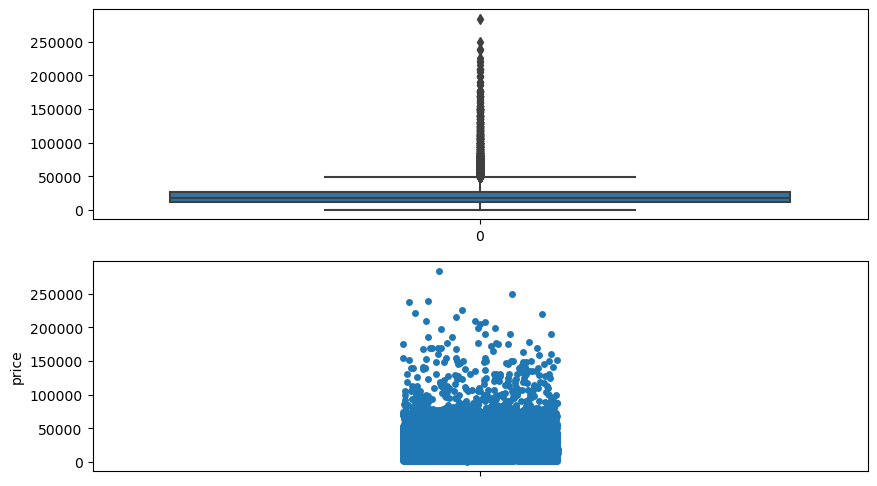

In [46]:
plt.figure(figsize=(10,6))

plt.subplot(211)
sns.boxplot(df.price)

plt.subplot(212)
sns.stripplot(df.price);

# We can get insights about outliers via boxplot. However, these insights can mislead us.
# In order to make more accurate comments, we can use the stripplot showing the distribution
# of categorical data. Although boxplot treats cars priced at 50 thousand EURO and above as outliers,
# stripplot tells us that the number of cars priced at 50 thousand EURO and around is not very few.
# But as we said above, our evaluation is not for the data in general. We will do it according to
# the groups in the data (Opel Astra, Ford Fiesta, Volvo S60 etc.).

In [47]:
#conda install -c anaconda ipywidgets

In [48]:
df[df.make_model=="Volvo V60"]

,make_model,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
22563,Volvo V60,10990.000,Station wagon,Used,No,239760.000,Automatic,Diesel,Dealer,1984.000,8.000,119.000,4WD,6,2075.000,Yes,Part/Full Leather,1.000,efficient,7.000,120.000,4.500,Standard,Standard,Safety Premium Package
22564,Volvo V60,43900.000,Station wagon,Used,No,92700.000,Automatic,Diesel,Dealer,1969.000,8.000,119.000,4WD,14,2075.000,Yes,Part/Full Leather,1.000,efficient,2.000,288.000,4.500,Premium,Plus,Safety Premium Package
22568,Volvo V60,42960.000,Station wagon,Used,No,63054.000,Automatic,Diesel,Dealer,1969.000,8.000,39.000,4WD,11,2075.000,Yes,Part/Full Leather,1.000,efficient,2.000,251.000,1.600,Premium,Standard,Safety Premium Package
22569,Volvo V60,10900.000,Station wagon,Used,No,172000.000,Manual,Diesel,Dealer,1984.000,6.000,132.000,Front,5,1724.000,Yes,Cloth,1.000,efficient,10.000,120.000,5.100,Standard,Standard,Safety Premium Package
22570,Volvo V60,27490.000,Station wagon,Used,Yes,94358.000,Automatic,Diesel,Dealer,1969.000,8.000,123.000,Front,12,2075.000,Yes,Part/Full Leather,1.000,efficient,3.000,110.000,4.600,Standard,Plus,Safety Premium Package
22572,Volvo V60,32990.000,Station wagon,Used,No,67500.000,Automatic,Diesel,Dealer,2400.000,8.000,119.000,4WD,8,2075.000,Yes,Part/Full Leather,1.000,efficient,6.000,212.000,1.800,Standard,Plus,Safety Premium Package
22574,Volvo V60,38990.000,Station wagon,Used,No,52147.000,Automatic,Diesel,Dealer,2400.000,8.000,0.000,4WD,5,2048.000,Yes,Cloth,1.000,efficient,5.000,212.000,1.800,Premium,Standard,Safety Premium Package
22575,Volvo V60,33920.000,Station wagon,Used,No,78211.000,Automatic,Benzine,Dealer,1969.000,8.000,171.000,4WD,10,1812.000,Yes,Part/Full Leather,1.000,unefficient,3.000,228.000,7.200,Premium,Plus,Safety Premium Package
22576,Volvo V60,20350.000,Station wagon,Used,No,81398.000,Automatic,Diesel,Dealer,1969.000,8.000,125.000,4WD,5,2075.000,No,Cloth,1.000,efficient,6.000,165.000,4.800,Premium,Standard,Safety Premium Package
22577,Volvo V60,17990.000,Station wagon,Used,Yes,139803.000,Manual,Diesel,Dealer,1969.000,6.000,120.000,Front,4,1690.000,No,Cloth,1.000,efficient,5.000,147.000,4.000,Premium,Standard,Safety Premium Package


In [49]:
from ipywidgets import interact

def box_strip(model):
    sns.boxplot(data = df[df.make_model==model],
                x= "make_model",
                y = "price",
                palette='bright')

    sns.stripplot(data = df[df.make_model==model],
                x= "make_model",
                y = "price",
                palette='Set1')
model = df.make_model.unique()
interact(box_strip, model=model);

# This code defines the function to plot an interactive boxplot and stripplot using the ipywidgets and seaborn libraries.
# The function superimposes the boxplot and stripplot graph showing the prices of different car models covered by the data.
# The interact() function allows the box_strip function to run by selecting the user through the interface.
# This selection determines the car model that will be used to draw the graph.

interactive(children=(Dropdown(description='model', options=('Mercedes-Benz A 45 AMG', 'Mercedes-Benz A 35 AMG…

In [50]:
df.make_model.unique()

# unique groups in our data

array(['Mercedes-Benz A 45 AMG', 'Mercedes-Benz A 35 AMG',
       'Mercedes-Benz CLA 180', 'Mercedes-Benz A 220',
       'Mercedes-Benz A 200', 'Mercedes-Benz A 250',
       'Mercedes-Benz A 180', 'Mercedes-Benz GLC 220',
       'Mercedes-Benz E 220', 'Mercedes-Benz AMG GT', 'Mercedes-Benz EQS',
       'Mercedes-Benz CL', 'Mercedes-Benz E 350', 'Mercedes-Benz CLA 200',
       'Mercedes-Benz E 53 AMG', 'Mercedes-Benz SLK 200',
       'Mercedes-Benz E 400', 'Mercedes-Benz C 400',
       'Mercedes-Benz C 43 AMG', 'Mercedes-Benz C 63 AMG',
       'Mercedes-Benz C 300', 'Mercedes-Benz E 300',
       'Mercedes-Benz C 200', 'Mercedes-Benz E 200',
       'Mercedes-Benz C 180', 'Mercedes-Benz C 250',
       'Mercedes-Benz C 220', 'Mercedes-Benz E 250',
       'Mercedes-Benz S 500', 'Mercedes-Benz CLA 45 AMG',
       'Mercedes-Benz CLS 350', 'Mercedes-Benz GLC 43 AMG',
       'Mercedes-Benz GLC 63 AMG', 'Mercedes-Benz GLC 250',
       'Mercedes-Benz GLC 300', 'Mercedes-Benz E 63 AMG', 'Opel Cors

In [51]:
df[df["make_model"]== "Mercedes-Benz A 180"]["price"]

# Prices of Mercedes-Benz A 180s. We will try to determine the outlier values for each car using this code.

9      24400.000
11      7450.000
14     29800.000
16     21000.000
17     26800.000
18     32900.000
21     21000.000
26     32950.000
29     18390.000
30     25900.000
31     25400.000
32     29900.000
33     14490.000
34     20630.000
35      8490.000
36     23850.000
38     29900.000
39     25900.000
40     16700.000
41     23850.000
42     27460.000
45     20630.000
46     21000.000
47     29900.000
49     25600.000
50     26850.000
52     25990.000
54     27800.000
55     29999.000
61     27900.000
64     27490.000
65     24780.000
66      9770.000
67     23850.000
70     31950.000
71     25000.000
72     14700.000
77      8950.000
91     10950.000
92     16750.000
95     12950.000
96     12445.000
102    14945.000
105    16950.000
114    19950.000
117     6400.000
118    13990.000
119    23990.000
120    16800.000
123    23990.000
130    27800.000
131    26850.000
132    31450.000
133    17944.000
136    23536.000
141    12245.000
144    27800.000
145    16945.000
147    26980.0

In [52]:
total_outliers = []

for model in df.make_model.unique():

    car_prices = df[df["make_model"]== model]["price"]

    Q1 = car_prices.quantile(0.25)
    Q3 = car_prices.quantile(0.75)
    IQR = Q3 - Q1
    lower_lim = Q1 - 1.5*IQR
    upper_lim = Q3 + 1.5*IQR

    count_of_outliers = (car_prices[(car_prices < lower_lim) | (car_prices > upper_lim)]).count()

    total_outliers.append(count_of_outliers)

    print(f" The count of outlier for {model:<24} : {count_of_outliers:<2},\
    The rate of outliers : {(count_of_outliers/len(df[df['make_model']== model])).round(3)}")
print()
print("Total_outliers : ",sum(total_outliers), "The rate of total outliers :", (sum(total_outliers)/len(df)).round(3))

# According to the 1.5 wisker value, we identify the data that we consider to be outliers belonging to each group.

 The count of outlier for Mercedes-Benz A 45 AMG   : 0 ,    The rate of outliers : 0.0
 The count of outlier for Mercedes-Benz A 35 AMG   : 0 ,    The rate of outliers : 0.0
 The count of outlier for Mercedes-Benz CLA 180    : 0 ,    The rate of outliers : 0.0
 The count of outlier for Mercedes-Benz A 220      : 0 ,    The rate of outliers : 0.0
 The count of outlier for Mercedes-Benz A 200      : 0 ,    The rate of outliers : 0.0
 The count of outlier for Mercedes-Benz A 250      : 4 ,    The rate of outliers : 0.091
 The count of outlier for Mercedes-Benz A 180      : 0 ,    The rate of outliers : 0.0
 The count of outlier for Mercedes-Benz GLC 220    : 4 ,    The rate of outliers : 0.114
 The count of outlier for Mercedes-Benz E 220      : 0 ,    The rate of outliers : 0.0
 The count of outlier for Mercedes-Benz AMG GT     : 1 ,    The rate of outliers : 0.015
 The count of outlier for Mercedes-Benz EQS        : 0 ,    The rate of outliers : 0.0
 The count of outlier for Mercedes-Be

 The count of outlier for Skoda Citigo             : 8 ,    The rate of outliers : 0.14
 The count of outlier for Skoda Superb             : 0 ,    The rate of outliers : 0.0
 The count of outlier for Skoda Kodiaq             : 0 ,    The rate of outliers : 0.0
 The count of outlier for Skoda Karoq              : 8 ,    The rate of outliers : 0.056
 The count of outlier for Dacia Spring             : 8 ,    The rate of outliers : 0.229
 The count of outlier for Dacia Sandero            : 7 ,    The rate of outliers : 0.01
 The count of outlier for Dacia Logan              : 1 ,    The rate of outliers : 0.005
 The count of outlier for Dacia Lodgy              : 2 ,    The rate of outliers : 0.028
 The count of outlier for Dacia Dokker             : 6 ,    The rate of outliers : 0.107
 The count of outlier for Dacia Duster             : 1 ,    The rate of outliers : 0.003
 The count of outlier for Dacia Jogger             : 0 ,    The rate of outliers : 0.0
 The count of outlier for Toy

## 2. Data Pre-Processing

As you know, the data set must be edited before proceeding to the implementation of the model. As the last step before model fitting, you need to spilit the data set as train and test. Then, you should train the model with train data and evaluate the performance of the model on the test data. You can use the train and test data you have created for all algorithms.

You must also drop your target variable, the column you are trying to predict.

You can use many [performance metrics for regression](https://medium.com/analytics-vidhya/evaluation-metrics-for-regression-problems-343c4923d922) to measure the performance of the regression model you train. You can define a function to view different metric results together.

You can also use the [cross validation](https://towardsdatascience.com/cross-validation-explained-evaluating-estimator-performance-e51e5430ff85) method to measure the estimator performance. Cross validation uses different data samples from your test set and calculates the accuracy score for each data sample. You can calculate the final performance of your estimator by averaging these scores.

### Train | Test Split

In [53]:
X= df.drop(columns="price")
y= df.price

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Converting Object Features into Numerical Features Using Make Column Transformer

In [55]:
df.select_dtypes(include="object").head(1)

,make_model,body_type,type,warranty,gearbox,fuel_type,seller,drivetrain,full_service_history,upholstery,energy_efficiency_class,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
0,Mercedes-Benz A 45 AMG,Compact,Used,Yes,Automatic,Benzine,Dealer,4WD,No,Part/Full Leather,unefficient,Standard,Standard,Safety Premium Plus Package


In [56]:
cat_onehot = ['make_model', 'body_type', 'warranty', 'gearbox', 'fuel_type', 'seller', 'drivetrain', 'full_service_history',
              'upholstery', 'energy_efficiency_class']
cat_ordinal = ['type', 'comfort_&_convenience_Package', 'entertainment_&_media_Package', 'safety_&_security_Package']

cat_for_type = ["Used", "Employee's car", "Demonstration", "Pre-registered"]
cat_for_comfort = ['Standard', 'Premium', 'Premium Plus']
cat_for_ent = ['Standard', 'Plus']
cat_for_safety = ['Safety Standard Package', 'Safety Premium Package', 'Safety Premium Plus Package']

# We specify the features we will convert to onohotencoder in the cat_onehot list,
# and the features that we will convert to ordinalencoder in the cat_ordinal list.

# Since the model does not know in which order the features we will transform will be numbered,
# we give this order to the model manually.

In [57]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

column_trans = make_column_transformer(
                        (OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_onehot),
                        (OrdinalEncoder(categories= [cat_for_type,
                                                     cat_for_comfort,
                                                     cat_for_ent,
                                                     cat_for_safety]),cat_ordinal),
                         remainder='passthrough',
                         verbose_feature_names_out=False) # MinMaxScaler()

column_trans=column_trans.set_output(transform="pandas")

# make_column_transformer function automates transformations to features. It transforms the features
# in order according to the order we will give into this function.

# What does the (OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot) code do?
# With the handle_unknown = "ignore" parameter, onehotencoder converts all the features in
# the cat_onehot list so that all categorical data passed in the test set and
# not in the train set will be converted to 0.

# What does the (OrdinalEncoder(categories=categories), cat_ordinal) code do?
# After the onehotencoder conversion to the relevant features, all features in the cat_ordinal list
# perform ordinal encoder conversion according to the hierarchical order of the unique categorical
# observations in the categories list.

# IMPORTANT NOTE: The order of the categories parameter of the OrdinalEncoder(categories=) function must be
# the same as the order of the features in the cat_ordinal list, or you will get an error.

# With remainder='passthrough' it means to leave all other features that are not converted.
# if the remainder is "dropped" with the default value, all non-converted features will be dropped from df.
# remainder= If we do MinMaxScaler() or StandardScale(), other features will be scaled except for
# the non-transformed features.

# verbose_feature_names_out=True make_column_transform function, so that it is clear which conversion function
# does which feature, "onehotencoder<__>" prefix at the beginning of onehotencoder conversions,
# ordinalencoder conversions. It is prefixed with "ordinalencoder<__>", and those with remainder operations
# are prefixed with "remainder__". If you want to remove these prefixes, we need to set verbose_feature<_>names_out=False.

In [58]:
X_train.head()

,make_model,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
16071,Nissan Micra,Compact,Pre-registered,Yes,3281.000,Manual,Benzine,Dealer,999.000,5.000,104.000,Front,1,1076.000,No,Cloth,1.000,efficient,1.000,68.000,4.500,Standard,Standard,Safety Premium Package
16228,Nissan 370Z,Convertible,Used,Yes,47748.000,Manual,Benzine,Dealer,3696.000,6.000,288.000,Rear,3,1610.000,No,Part/Full Leather,1.000,unefficient,3.000,245.000,10.900,Standard,Standard,Safety Premium Package
2117,Opel Astra,Convertible,Used,No,160000.000,Manual,Benzine,Private seller,2198.000,5.000,197.000,Rear,5,1393.000,No,Part/Full Leather,2.000,efficient,19.000,108.000,8.200,Standard,Standard,Safety Premium Package
22283,Volvo XC60,Off-Road/Pick-up,Used,No,58000.000,Automatic,Benzine,Dealer,1969.000,8.000,49.000,4WD,16,2169.000,Yes,Part/Full Leather,1.000,efficient,4.000,298.000,2.100,Premium,Plus,Safety Premium Package
17617,Nissan Qashqai,Sedan,Used,Yes,62096.000,Manual,Diesel,Dealer,1600.000,6.000,116.000,Front,1,1331.000,No,Part/Full Leather,1.000,efficient,5.000,96.000,4.700,Standard,Standard,Safety Standard Package


In [59]:
X_test.head()

,make_model,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
10810,SEAT Leon,Station wagon,Used,Yes,219000.000,Manual,Diesel,Dealer,1598.000,5.000,109.000,Front,1,1331.000,No,Cloth,4.000,unefficient,8.000,77.000,3.800,Standard,Standard,Safety Premium Package
1288,Mercedes-Benz C 200,Sedan,Used,Yes,114673.000,Automatic,Diesel,Dealer,1597.000,7.000,136.000,Rear,9,1650.000,Yes,Cloth,1.000,efficient,3.000,118.000,4.300,Standard,Plus,Safety Premium Package
5535,Renault Megane,Sedan,Used,Yes,38022.000,Automatic,Benzine,Dealer,1798.000,6.000,161.000,Front,4,1315.000,Yes,Cloth,2.000,efficient,4.000,206.000,6.900,Standard,Standard,Safety Premium Package
12655,Skoda Scala,Sedan,Used,No,35482.000,Automatic,Diesel,Dealer,1598.000,7.000,106.000,Front,2,1339.000,No,Cloth,1.000,efficient,3.000,85.000,4.000,Standard,Plus,Safety Premium Package
8603,Fiat Tipo,Coupe,Used,No,90000.000,Manual,Liquid/Natural Gas,Private seller,1368.000,6.000,117.000,Front,2,1395.000,No,Part/Full Leather,1.000,efficient,5.000,88.000,4.600,Standard,Plus,Safety Premium Package


In [60]:
X_train.shape, X_test.shape

((18587, 24), (4647, 24))

In [61]:
column_trans.fit_transform(X_train).head()

,make_model_Dacia Dokker,make_model_Dacia Duster,make_model_Dacia Jogger,make_model_Dacia Lodgy,make_model_Dacia Logan,make_model_Dacia Sandero,make_model_Dacia Spring,make_model_Fiat 124 Spider,make_model_Fiat 500,make_model_Fiat 500 Abarth,make_model_Fiat 500C,make_model_Fiat 500L,make_model_Fiat 500X,make_model_Fiat 500e,make_model_Fiat Panda,make_model_Fiat Punto,make_model_Fiat Punto Evo,make_model_Fiat Tipo,make_model_Ford EcoSport,make_model_Ford Edge,make_model_Ford Fiesta,make_model_Ford Focus,make_model_Ford Ka/Ka+,make_model_Ford Kuga,make_model_Ford Mondeo,make_model_Ford Mustang,make_model_Ford Puma,make_model_Ford Ranger,make_model_Hyundai BAYON,make_model_Hyundai Coupe,make_model_Hyundai ELANTRA,make_model_Hyundai Genesis,make_model_Hyundai IONIQ,make_model_Hyundai KONA,make_model_Hyundai SANTA FE,make_model_Hyundai TUCSON,make_model_Hyundai VELOSTER,make_model_Hyundai i10,make_model_Hyundai i20,make_model_Hyundai i30,make_model_Hyundai i40,make_model_Hyundai iX20,make_model_Hyundai iX35,make_model_Mercedes-Benz A 180,make_model_Mercedes-Benz A 200,make_model_Mercedes-Benz A 220,make_model_Mercedes-Benz A 250,make_model_Mercedes-Benz A 35 AMG,make_model_Mercedes-Benz A 45 AMG,make_model_Mercedes-Benz AMG GT,make_model_Mercedes-Benz C 180,make_model_Mercedes-Benz C 200,make_model_Mercedes-Benz C 220,make_model_Mercedes-Benz C 250,make_model_Mercedes-Benz C 300,make_model_Mercedes-Benz C 400,make_model_Mercedes-Benz C 43 AMG,make_model_Mercedes-Benz C 63 AMG,make_model_Mercedes-Benz CL,make_model_Mercedes-Benz CLA 180,make_model_Mercedes-Benz CLA 200,make_model_Mercedes-Benz CLA 45 AMG,make_model_Mercedes-Benz CLS 350,make_model_Mercedes-Benz E 200,make_model_Mercedes-Benz E 220,make_model_Mercedes-Benz E 250,make_model_Mercedes-Benz E 300,make_model_Mercedes-Benz E 350,make_model_Mercedes-Benz E 400,make_model_Mercedes-Benz E 53 AMG,make_model_Mercedes-Benz E 63 AMG,make_model_Mercedes-Benz EQS,make_model_Mercedes-Benz GLC 220,make_model_Mercedes-Benz GLC 250,make_model_Mercedes-Benz GLC 300,make_model_Mercedes-Benz GLC 43 AMG,make_model_Mercedes-Benz GLC 63 AMG,make_model_Mercedes-Benz S 500,make_model_Mercedes-Benz SLK 200,make_model_Nissan 350Z,make_model_Nissan 370Z,make_model_Nissan GT-R,make_model_Nissan Juke,make_model_Nissan Leaf,make_model_Nissan Micra,make_model_Nissan Murano,make_model_Nissan NV200,make_model_Nissan Note,make_model_Nissan Primera,make_model_Nissan Pulsar,make_model_Nissan Qashqai,make_model_Nissan Townstar,make_model_Nissan X-Trail,make_model_Opel Adam,make_model_Opel Astra,make_model_Opel Cascada,make_model_Opel Corsa,make_model_Opel Crossland,make_model_Opel Crossland X,make_model_Opel GT,make_model_Opel Grandland,make_model_Opel Grandland X,make_model_Opel Insignia,make_model_Opel Mokka,make_model_Opel Mokka X,make_model_Opel Tigra,make_model_Peugeot 107,make_model_Peugeot 108,make_model_Peugeot 2008,make_model_Peugeot 206,make_model_Peugeot 207,make_model_Peugeot 208,make_model_Peugeot 3008,make_model_Peugeot 307,make_model_Peugeot 308,make_model_Peugeot 407,make_model_Peugeot 5008,make_model_Peugeot 508,make_model_Peugeot RCZ,make_model_Renault Alpine A110,make_model_Renault Arkana,make_model_Renault Captur,make_model_Renault Clio,make_model_Renault Kadjar,make_model_Renault Koleos,make_model_Renault Laguna,make_model_Renault Megane,make_model_Renault Talisman,make_model_Renault Twingo,make_model_Renault Wind,make_model_Renault ZOE,make_model_SEAT Arona,make_model_SEAT Ateca,make_model_SEAT Ibiza,make_model_SEAT Leon,make_model_SEAT Mii,make_model_SEAT Tarraco,make_model_Skoda Citigo,make_model_Skoda Fabia,make_model_Skoda Kamiq,make_model_Skoda Karoq,make_model_Skoda Kodiaq,make_model_Skoda Octavia,make_model_Skoda Rapid/Spaceback,make_model_Skoda Scala,make_model_Skoda Superb,make_model_Toyota Auris,make_model_Toyota Avensis,make_model_Toyota Aygo,make_model_Toyota Aygo X,make_model_Toyota C-HR,make_model_Toyota Corolla,make_model_Toyota GT86,make_model_Toyota Hilux,make_model_T

In [62]:
X_train_trans = column_trans.fit_transform(X_train)
X_test_trans = column_trans.transform(X_test)

In [63]:
X_train_trans.shape, X_test_trans.shape # 24 features --> 110 features

((18587, 214), (4647, 214))

In [64]:
X_train_trans.head()

,make_model_Dacia Dokker,make_model_Dacia Duster,make_model_Dacia Jogger,make_model_Dacia Lodgy,make_model_Dacia Logan,make_model_Dacia Sandero,make_model_Dacia Spring,make_model_Fiat 124 Spider,make_model_Fiat 500,make_model_Fiat 500 Abarth,make_model_Fiat 500C,make_model_Fiat 500L,make_model_Fiat 500X,make_model_Fiat 500e,make_model_Fiat Panda,make_model_Fiat Punto,make_model_Fiat Punto Evo,make_model_Fiat Tipo,make_model_Ford EcoSport,make_model_Ford Edge,make_model_Ford Fiesta,make_model_Ford Focus,make_model_Ford Ka/Ka+,make_model_Ford Kuga,make_model_Ford Mondeo,make_model_Ford Mustang,make_model_Ford Puma,make_model_Ford Ranger,make_model_Hyundai BAYON,make_model_Hyundai Coupe,make_model_Hyundai ELANTRA,make_model_Hyundai Genesis,make_model_Hyundai IONIQ,make_model_Hyundai KONA,make_model_Hyundai SANTA FE,make_model_Hyundai TUCSON,make_model_Hyundai VELOSTER,make_model_Hyundai i10,make_model_Hyundai i20,make_model_Hyundai i30,make_model_Hyundai i40,make_model_Hyundai iX20,make_model_Hyundai iX35,make_model_Mercedes-Benz A 180,make_model_Mercedes-Benz A 200,make_model_Mercedes-Benz A 220,make_model_Mercedes-Benz A 250,make_model_Mercedes-Benz A 35 AMG,make_model_Mercedes-Benz A 45 AMG,make_model_Mercedes-Benz AMG GT,make_model_Mercedes-Benz C 180,make_model_Mercedes-Benz C 200,make_model_Mercedes-Benz C 220,make_model_Mercedes-Benz C 250,make_model_Mercedes-Benz C 300,make_model_Mercedes-Benz C 400,make_model_Mercedes-Benz C 43 AMG,make_model_Mercedes-Benz C 63 AMG,make_model_Mercedes-Benz CL,make_model_Mercedes-Benz CLA 180,make_model_Mercedes-Benz CLA 200,make_model_Mercedes-Benz CLA 45 AMG,make_model_Mercedes-Benz CLS 350,make_model_Mercedes-Benz E 200,make_model_Mercedes-Benz E 220,make_model_Mercedes-Benz E 250,make_model_Mercedes-Benz E 300,make_model_Mercedes-Benz E 350,make_model_Mercedes-Benz E 400,make_model_Mercedes-Benz E 53 AMG,make_model_Mercedes-Benz E 63 AMG,make_model_Mercedes-Benz EQS,make_model_Mercedes-Benz GLC 220,make_model_Mercedes-Benz GLC 250,make_model_Mercedes-Benz GLC 300,make_model_Mercedes-Benz GLC 43 AMG,make_model_Mercedes-Benz GLC 63 AMG,make_model_Mercedes-Benz S 500,make_model_Mercedes-Benz SLK 200,make_model_Nissan 350Z,make_model_Nissan 370Z,make_model_Nissan GT-R,make_model_Nissan Juke,make_model_Nissan Leaf,make_model_Nissan Micra,make_model_Nissan Murano,make_model_Nissan NV200,make_model_Nissan Note,make_model_Nissan Primera,make_model_Nissan Pulsar,make_model_Nissan Qashqai,make_model_Nissan Townstar,make_model_Nissan X-Trail,make_model_Opel Adam,make_model_Opel Astra,make_model_Opel Cascada,make_model_Opel Corsa,make_model_Opel Crossland,make_model_Opel Crossland X,make_model_Opel GT,make_model_Opel Grandland,make_model_Opel Grandland X,make_model_Opel Insignia,make_model_Opel Mokka,make_model_Opel Mokka X,make_model_Opel Tigra,make_model_Peugeot 107,make_model_Peugeot 108,make_model_Peugeot 2008,make_model_Peugeot 206,make_model_Peugeot 207,make_model_Peugeot 208,make_model_Peugeot 3008,make_model_Peugeot 307,make_model_Peugeot 308,make_model_Peugeot 407,make_model_Peugeot 5008,make_model_Peugeot 508,make_model_Peugeot RCZ,make_model_Renault Alpine A110,make_model_Renault Arkana,make_model_Renault Captur,make_model_Renault Clio,make_model_Renault Kadjar,make_model_Renault Koleos,make_model_Renault Laguna,make_model_Renault Megane,make_model_Renault Talisman,make_model_Renault Twingo,make_model_Renault Wind,make_model_Renault ZOE,make_model_SEAT Arona,make_model_SEAT Ateca,make_model_SEAT Ibiza,make_model_SEAT Leon,make_model_SEAT Mii,make_model_SEAT Tarraco,make_model_Skoda Citigo,make_model_Skoda Fabia,make_model_Skoda Kamiq,make_model_Skoda Karoq,make_model_Skoda Kodiaq,make_model_Skoda Octavia,make_model_Skoda Rapid/Spaceback,make_model_Skoda Scala,make_model_Skoda Superb,make_model_Toyota Auris,make_model_Toyota Avensis,make_model_Toyota Aygo,make_model_Toyota Aygo X,make_model_Toyota C-HR,make_model_Toyota Corolla,make_model_Toyota GT86,make_model_Toyota Hilux,make_model_T

In [65]:
X_test_trans.head()

,make_model_Dacia Dokker,make_model_Dacia Duster,make_model_Dacia Jogger,make_model_Dacia Lodgy,make_model_Dacia Logan,make_model_Dacia Sandero,make_model_Dacia Spring,make_model_Fiat 124 Spider,make_model_Fiat 500,make_model_Fiat 500 Abarth,make_model_Fiat 500C,make_model_Fiat 500L,make_model_Fiat 500X,make_model_Fiat 500e,make_model_Fiat Panda,make_model_Fiat Punto,make_model_Fiat Punto Evo,make_model_Fiat Tipo,make_model_Ford EcoSport,make_model_Ford Edge,make_model_Ford Fiesta,make_model_Ford Focus,make_model_Ford Ka/Ka+,make_model_Ford Kuga,make_model_Ford Mondeo,make_model_Ford Mustang,make_model_Ford Puma,make_model_Ford Ranger,make_model_Hyundai BAYON,make_model_Hyundai Coupe,make_model_Hyundai ELANTRA,make_model_Hyundai Genesis,make_model_Hyundai IONIQ,make_model_Hyundai KONA,make_model_Hyundai SANTA FE,make_model_Hyundai TUCSON,make_model_Hyundai VELOSTER,make_model_Hyundai i10,make_model_Hyundai i20,make_model_Hyundai i30,make_model_Hyundai i40,make_model_Hyundai iX20,make_model_Hyundai iX35,make_model_Mercedes-Benz A 180,make_model_Mercedes-Benz A 200,make_model_Mercedes-Benz A 220,make_model_Mercedes-Benz A 250,make_model_Mercedes-Benz A 35 AMG,make_model_Mercedes-Benz A 45 AMG,make_model_Mercedes-Benz AMG GT,make_model_Mercedes-Benz C 180,make_model_Mercedes-Benz C 200,make_model_Mercedes-Benz C 220,make_model_Mercedes-Benz C 250,make_model_Mercedes-Benz C 300,make_model_Mercedes-Benz C 400,make_model_Mercedes-Benz C 43 AMG,make_model_Mercedes-Benz C 63 AMG,make_model_Mercedes-Benz CL,make_model_Mercedes-Benz CLA 180,make_model_Mercedes-Benz CLA 200,make_model_Mercedes-Benz CLA 45 AMG,make_model_Mercedes-Benz CLS 350,make_model_Mercedes-Benz E 200,make_model_Mercedes-Benz E 220,make_model_Mercedes-Benz E 250,make_model_Mercedes-Benz E 300,make_model_Mercedes-Benz E 350,make_model_Mercedes-Benz E 400,make_model_Mercedes-Benz E 53 AMG,make_model_Mercedes-Benz E 63 AMG,make_model_Mercedes-Benz EQS,make_model_Mercedes-Benz GLC 220,make_model_Mercedes-Benz GLC 250,make_model_Mercedes-Benz GLC 300,make_model_Mercedes-Benz GLC 43 AMG,make_model_Mercedes-Benz GLC 63 AMG,make_model_Mercedes-Benz S 500,make_model_Mercedes-Benz SLK 200,make_model_Nissan 350Z,make_model_Nissan 370Z,make_model_Nissan GT-R,make_model_Nissan Juke,make_model_Nissan Leaf,make_model_Nissan Micra,make_model_Nissan Murano,make_model_Nissan NV200,make_model_Nissan Note,make_model_Nissan Primera,make_model_Nissan Pulsar,make_model_Nissan Qashqai,make_model_Nissan Townstar,make_model_Nissan X-Trail,make_model_Opel Adam,make_model_Opel Astra,make_model_Opel Cascada,make_model_Opel Corsa,make_model_Opel Crossland,make_model_Opel Crossland X,make_model_Opel GT,make_model_Opel Grandland,make_model_Opel Grandland X,make_model_Opel Insignia,make_model_Opel Mokka,make_model_Opel Mokka X,make_model_Opel Tigra,make_model_Peugeot 107,make_model_Peugeot 108,make_model_Peugeot 2008,make_model_Peugeot 206,make_model_Peugeot 207,make_model_Peugeot 208,make_model_Peugeot 3008,make_model_Peugeot 307,make_model_Peugeot 308,make_model_Peugeot 407,make_model_Peugeot 5008,make_model_Peugeot 508,make_model_Peugeot RCZ,make_model_Renault Alpine A110,make_model_Renault Arkana,make_model_Renault Captur,make_model_Renault Clio,make_model_Renault Kadjar,make_model_Renault Koleos,make_model_Renault Laguna,make_model_Renault Megane,make_model_Renault Talisman,make_model_Renault Twingo,make_model_Renault Wind,make_model_Renault ZOE,make_model_SEAT Arona,make_model_SEAT Ateca,make_model_SEAT Ibiza,make_model_SEAT Leon,make_model_SEAT Mii,make_model_SEAT Tarraco,make_model_Skoda Citigo,make_model_Skoda Fabia,make_model_Skoda Kamiq,make_model_Skoda Karoq,make_model_Skoda Kodiaq,make_model_Skoda Octavia,make_model_Skoda Rapid/Spaceback,make_model_Skoda Scala,make_model_Skoda Superb,make_model_Toyota Auris,make_model_Toyota Avensis,make_model_Toyota Aygo,make_model_Toyota Aygo X,make_model_Toyota C-HR,make_model_Toyota Corolla,make_model_Toyota GT86,make_model_Toyota Hilux,make_model_T

In [66]:
X_train_trans.join(y_train).corr()

,make_model_Dacia Dokker,make_model_Dacia Duster,make_model_Dacia Jogger,make_model_Dacia Lodgy,make_model_Dacia Logan,make_model_Dacia Sandero,make_model_Dacia Spring,make_model_Fiat 124 Spider,make_model_Fiat 500,make_model_Fiat 500 Abarth,make_model_Fiat 500C,make_model_Fiat 500L,make_model_Fiat 500X,make_model_Fiat 500e,make_model_Fiat Panda,make_model_Fiat Punto,make_model_Fiat Punto Evo,make_model_Fiat Tipo,make_model_Ford EcoSport,make_model_Ford Edge,make_model_Ford Fiesta,make_model_Ford Focus,make_model_Ford Ka/Ka+,make_model_Ford Kuga,make_model_Ford Mondeo,make_model_Ford Mustang,make_model_Ford Puma,make_model_Ford Ranger,make_model_Hyundai BAYON,make_model_Hyundai Coupe,make_model_Hyundai ELANTRA,make_model_Hyundai Genesis,make_model_Hyundai IONIQ,make_model_Hyundai KONA,make_model_Hyundai SANTA FE,make_model_Hyundai TUCSON,make_model_Hyundai VELOSTER,make_model_Hyundai i10,make_model_Hyundai i20,make_model_Hyundai i30,make_model_Hyundai i40,make_model_Hyundai iX20,make_model_Hyundai iX35,make_model_Mercedes-Benz A 180,make_model_Mercedes-Benz A 200,make_model_Mercedes-Benz A 220,make_model_Mercedes-Benz A 250,make_model_Mercedes-Benz A 35 AMG,make_model_Mercedes-Benz A 45 AMG,make_model_Mercedes-Benz AMG GT,make_model_Mercedes-Benz C 180,make_model_Mercedes-Benz C 200,make_model_Mercedes-Benz C 220,make_model_Mercedes-Benz C 250,make_model_Mercedes-Benz C 300,make_model_Mercedes-Benz C 400,make_model_Mercedes-Benz C 43 AMG,make_model_Mercedes-Benz C 63 AMG,make_model_Mercedes-Benz CL,make_model_Mercedes-Benz CLA 180,make_model_Mercedes-Benz CLA 200,make_model_Mercedes-Benz CLA 45 AMG,make_model_Mercedes-Benz CLS 350,make_model_Mercedes-Benz E 200,make_model_Mercedes-Benz E 220,make_model_Mercedes-Benz E 250,make_model_Mercedes-Benz E 300,make_model_Mercedes-Benz E 350,make_model_Mercedes-Benz E 400,make_model_Mercedes-Benz E 53 AMG,make_model_Mercedes-Benz E 63 AMG,make_model_Mercedes-Benz EQS,make_model_Mercedes-Benz GLC 220,make_model_Mercedes-Benz GLC 250,make_model_Mercedes-Benz GLC 300,make_model_Mercedes-Benz GLC 43 AMG,make_model_Mercedes-Benz GLC 63 AMG,make_model_Mercedes-Benz S 500,make_model_Mercedes-Benz SLK 200,make_model_Nissan 350Z,make_model_Nissan 370Z,make_model_Nissan GT-R,make_model_Nissan Juke,make_model_Nissan Leaf,make_model_Nissan Micra,make_model_Nissan Murano,make_model_Nissan NV200,make_model_Nissan Note,make_model_Nissan Primera,make_model_Nissan Pulsar,make_model_Nissan Qashqai,make_model_Nissan Townstar,make_model_Nissan X-Trail,make_model_Opel Adam,make_model_Opel Astra,make_model_Opel Cascada,make_model_Opel Corsa,make_model_Opel Crossland,make_model_Opel Crossland X,make_model_Opel GT,make_model_Opel Grandland,make_model_Opel Grandland X,make_model_Opel Insignia,make_model_Opel Mokka,make_model_Opel Mokka X,make_model_Opel Tigra,make_model_Peugeot 107,make_model_Peugeot 108,make_model_Peugeot 2008,make_model_Peugeot 206,make_model_Peugeot 207,make_model_Peugeot 208,make_model_Peugeot 3008,make_model_Peugeot 307,make_model_Peugeot 308,make_model_Peugeot 407,make_model_Peugeot 5008,make_model_Peugeot 508,make_model_Peugeot RCZ,make_model_Renault Alpine A110,make_model_Renault Arkana,make_model_Renault Captur,make_model_Renault Clio,make_model_Renault Kadjar,make_model_Renault Koleos,make_model_Renault Laguna,make_model_Renault Megane,make_model_Renault Talisman,make_model_Renault Twingo,make_model_Renault Wind,make_model_Renault ZOE,make_model_SEAT Arona,make_model_SEAT Ateca,make_model_SEAT Ibiza,make_model_SEAT Leon,make_model_SEAT Mii,make_model_SEAT Tarraco,make_model_Skoda Citigo,make_model_Skoda Fabia,make_model_Skoda Kamiq,make_model_Skoda Karoq,make_model_Skoda Kodiaq,make_model_Skoda Octavia,make_model_Skoda Rapid/Spaceback,make_model_Skoda Scala,make_model_Skoda Superb,make_model_Toyota Auris,make_model_Toyota Avensis,make_model_Toyota Aygo,make_model_Toyota Aygo X,make_model_Toyota C-HR,make_model_Toyota Corolla,make_model_Toyota GT86,make_model_Toyota Hilux,make_model_T

In [67]:
import plotly.express as px

corr = X_train_trans.join(y_train).corr()
fig = px.imshow(corr,width=1000, height=1000)
fig.show()

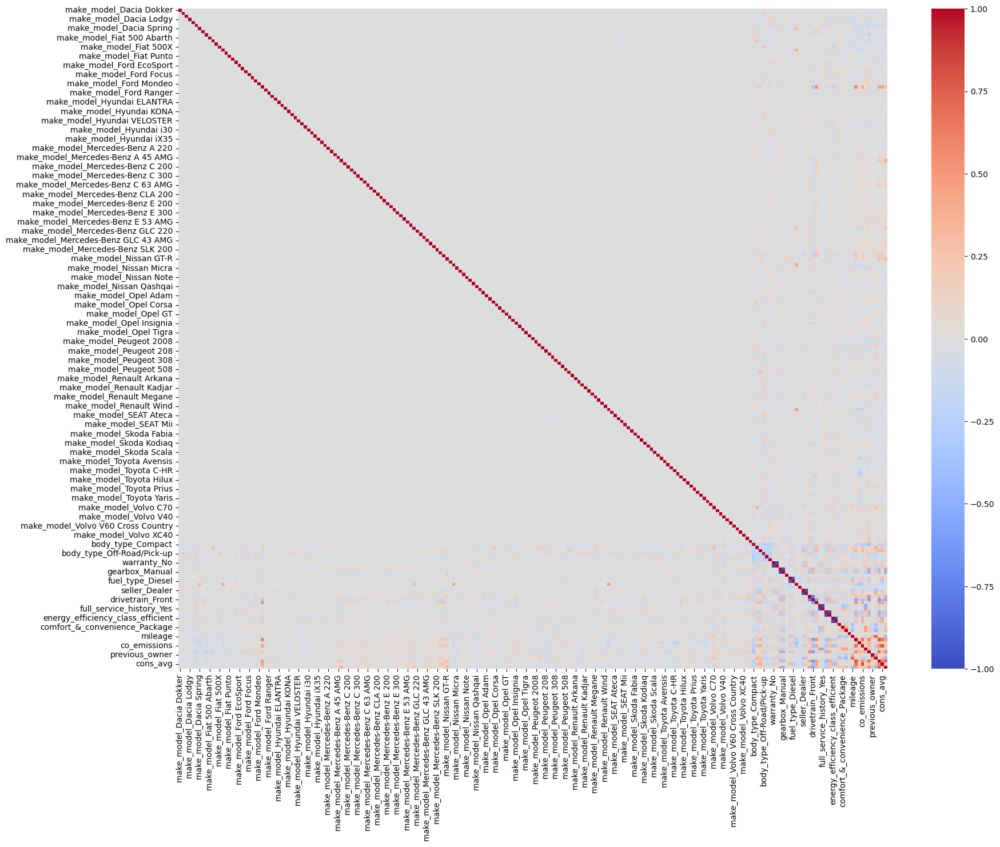

In [68]:
plt.figure(figsize=(20,15))
sns.heatmap(X_train_trans.join(y_train).corr(), vmin=-1, vmax=1, cmap="coolwarm");

### Scaling

In [69]:
scaler = MinMaxScaler().set_output(transform="pandas")
scaler.fit(X_train_trans)

X_train_scaled = scaler.transform(X_train_trans)
X_test_scaled = scaler.transform(X_test_trans)

In [70]:
X_train_scaled.head()

,make_model_Dacia Dokker,make_model_Dacia Duster,make_model_Dacia Jogger,make_model_Dacia Lodgy,make_model_Dacia Logan,make_model_Dacia Sandero,make_model_Dacia Spring,make_model_Fiat 124 Spider,make_model_Fiat 500,make_model_Fiat 500 Abarth,make_model_Fiat 500C,make_model_Fiat 500L,make_model_Fiat 500X,make_model_Fiat 500e,make_model_Fiat Panda,make_model_Fiat Punto,make_model_Fiat Punto Evo,make_model_Fiat Tipo,make_model_Ford EcoSport,make_model_Ford Edge,make_model_Ford Fiesta,make_model_Ford Focus,make_model_Ford Ka/Ka+,make_model_Ford Kuga,make_model_Ford Mondeo,make_model_Ford Mustang,make_model_Ford Puma,make_model_Ford Ranger,make_model_Hyundai BAYON,make_model_Hyundai Coupe,make_model_Hyundai ELANTRA,make_model_Hyundai Genesis,make_model_Hyundai IONIQ,make_model_Hyundai KONA,make_model_Hyundai SANTA FE,make_model_Hyundai TUCSON,make_model_Hyundai VELOSTER,make_model_Hyundai i10,make_model_Hyundai i20,make_model_Hyundai i30,make_model_Hyundai i40,make_model_Hyundai iX20,make_model_Hyundai iX35,make_model_Mercedes-Benz A 180,make_model_Mercedes-Benz A 200,make_model_Mercedes-Benz A 220,make_model_Mercedes-Benz A 250,make_model_Mercedes-Benz A 35 AMG,make_model_Mercedes-Benz A 45 AMG,make_model_Mercedes-Benz AMG GT,make_model_Mercedes-Benz C 180,make_model_Mercedes-Benz C 200,make_model_Mercedes-Benz C 220,make_model_Mercedes-Benz C 250,make_model_Mercedes-Benz C 300,make_model_Mercedes-Benz C 400,make_model_Mercedes-Benz C 43 AMG,make_model_Mercedes-Benz C 63 AMG,make_model_Mercedes-Benz CL,make_model_Mercedes-Benz CLA 180,make_model_Mercedes-Benz CLA 200,make_model_Mercedes-Benz CLA 45 AMG,make_model_Mercedes-Benz CLS 350,make_model_Mercedes-Benz E 200,make_model_Mercedes-Benz E 220,make_model_Mercedes-Benz E 250,make_model_Mercedes-Benz E 300,make_model_Mercedes-Benz E 350,make_model_Mercedes-Benz E 400,make_model_Mercedes-Benz E 53 AMG,make_model_Mercedes-Benz E 63 AMG,make_model_Mercedes-Benz EQS,make_model_Mercedes-Benz GLC 220,make_model_Mercedes-Benz GLC 250,make_model_Mercedes-Benz GLC 300,make_model_Mercedes-Benz GLC 43 AMG,make_model_Mercedes-Benz GLC 63 AMG,make_model_Mercedes-Benz S 500,make_model_Mercedes-Benz SLK 200,make_model_Nissan 350Z,make_model_Nissan 370Z,make_model_Nissan GT-R,make_model_Nissan Juke,make_model_Nissan Leaf,make_model_Nissan Micra,make_model_Nissan Murano,make_model_Nissan NV200,make_model_Nissan Note,make_model_Nissan Primera,make_model_Nissan Pulsar,make_model_Nissan Qashqai,make_model_Nissan Townstar,make_model_Nissan X-Trail,make_model_Opel Adam,make_model_Opel Astra,make_model_Opel Cascada,make_model_Opel Corsa,make_model_Opel Crossland,make_model_Opel Crossland X,make_model_Opel GT,make_model_Opel Grandland,make_model_Opel Grandland X,make_model_Opel Insignia,make_model_Opel Mokka,make_model_Opel Mokka X,make_model_Opel Tigra,make_model_Peugeot 107,make_model_Peugeot 108,make_model_Peugeot 2008,make_model_Peugeot 206,make_model_Peugeot 207,make_model_Peugeot 208,make_model_Peugeot 3008,make_model_Peugeot 307,make_model_Peugeot 308,make_model_Peugeot 407,make_model_Peugeot 5008,make_model_Peugeot 508,make_model_Peugeot RCZ,make_model_Renault Alpine A110,make_model_Renault Arkana,make_model_Renault Captur,make_model_Renault Clio,make_model_Renault Kadjar,make_model_Renault Koleos,make_model_Renault Laguna,make_model_Renault Megane,make_model_Renault Talisman,make_model_Renault Twingo,make_model_Renault Wind,make_model_Renault ZOE,make_model_SEAT Arona,make_model_SEAT Ateca,make_model_SEAT Ibiza,make_model_SEAT Leon,make_model_SEAT Mii,make_model_SEAT Tarraco,make_model_Skoda Citigo,make_model_Skoda Fabia,make_model_Skoda Kamiq,make_model_Skoda Karoq,make_model_Skoda Kodiaq,make_model_Skoda Octavia,make_model_Skoda Rapid/Spaceback,make_model_Skoda Scala,make_model_Skoda Superb,make_model_Toyota Auris,make_model_Toyota Avensis,make_model_Toyota Aygo,make_model_Toyota Aygo X,make_model_Toyota C-HR,make_model_Toyota Corolla,make_model_Toyota GT86,make_model_Toyota Hilux,make_model_T

In [71]:
X_test_scaled.head()

,make_model_Dacia Dokker,make_model_Dacia Duster,make_model_Dacia Jogger,make_model_Dacia Lodgy,make_model_Dacia Logan,make_model_Dacia Sandero,make_model_Dacia Spring,make_model_Fiat 124 Spider,make_model_Fiat 500,make_model_Fiat 500 Abarth,make_model_Fiat 500C,make_model_Fiat 500L,make_model_Fiat 500X,make_model_Fiat 500e,make_model_Fiat Panda,make_model_Fiat Punto,make_model_Fiat Punto Evo,make_model_Fiat Tipo,make_model_Ford EcoSport,make_model_Ford Edge,make_model_Ford Fiesta,make_model_Ford Focus,make_model_Ford Ka/Ka+,make_model_Ford Kuga,make_model_Ford Mondeo,make_model_Ford Mustang,make_model_Ford Puma,make_model_Ford Ranger,make_model_Hyundai BAYON,make_model_Hyundai Coupe,make_model_Hyundai ELANTRA,make_model_Hyundai Genesis,make_model_Hyundai IONIQ,make_model_Hyundai KONA,make_model_Hyundai SANTA FE,make_model_Hyundai TUCSON,make_model_Hyundai VELOSTER,make_model_Hyundai i10,make_model_Hyundai i20,make_model_Hyundai i30,make_model_Hyundai i40,make_model_Hyundai iX20,make_model_Hyundai iX35,make_model_Mercedes-Benz A 180,make_model_Mercedes-Benz A 200,make_model_Mercedes-Benz A 220,make_model_Mercedes-Benz A 250,make_model_Mercedes-Benz A 35 AMG,make_model_Mercedes-Benz A 45 AMG,make_model_Mercedes-Benz AMG GT,make_model_Mercedes-Benz C 180,make_model_Mercedes-Benz C 200,make_model_Mercedes-Benz C 220,make_model_Mercedes-Benz C 250,make_model_Mercedes-Benz C 300,make_model_Mercedes-Benz C 400,make_model_Mercedes-Benz C 43 AMG,make_model_Mercedes-Benz C 63 AMG,make_model_Mercedes-Benz CL,make_model_Mercedes-Benz CLA 180,make_model_Mercedes-Benz CLA 200,make_model_Mercedes-Benz CLA 45 AMG,make_model_Mercedes-Benz CLS 350,make_model_Mercedes-Benz E 200,make_model_Mercedes-Benz E 220,make_model_Mercedes-Benz E 250,make_model_Mercedes-Benz E 300,make_model_Mercedes-Benz E 350,make_model_Mercedes-Benz E 400,make_model_Mercedes-Benz E 53 AMG,make_model_Mercedes-Benz E 63 AMG,make_model_Mercedes-Benz EQS,make_model_Mercedes-Benz GLC 220,make_model_Mercedes-Benz GLC 250,make_model_Mercedes-Benz GLC 300,make_model_Mercedes-Benz GLC 43 AMG,make_model_Mercedes-Benz GLC 63 AMG,make_model_Mercedes-Benz S 500,make_model_Mercedes-Benz SLK 200,make_model_Nissan 350Z,make_model_Nissan 370Z,make_model_Nissan GT-R,make_model_Nissan Juke,make_model_Nissan Leaf,make_model_Nissan Micra,make_model_Nissan Murano,make_model_Nissan NV200,make_model_Nissan Note,make_model_Nissan Primera,make_model_Nissan Pulsar,make_model_Nissan Qashqai,make_model_Nissan Townstar,make_model_Nissan X-Trail,make_model_Opel Adam,make_model_Opel Astra,make_model_Opel Cascada,make_model_Opel Corsa,make_model_Opel Crossland,make_model_Opel Crossland X,make_model_Opel GT,make_model_Opel Grandland,make_model_Opel Grandland X,make_model_Opel Insignia,make_model_Opel Mokka,make_model_Opel Mokka X,make_model_Opel Tigra,make_model_Peugeot 107,make_model_Peugeot 108,make_model_Peugeot 2008,make_model_Peugeot 206,make_model_Peugeot 207,make_model_Peugeot 208,make_model_Peugeot 3008,make_model_Peugeot 307,make_model_Peugeot 308,make_model_Peugeot 407,make_model_Peugeot 5008,make_model_Peugeot 508,make_model_Peugeot RCZ,make_model_Renault Alpine A110,make_model_Renault Arkana,make_model_Renault Captur,make_model_Renault Clio,make_model_Renault Kadjar,make_model_Renault Koleos,make_model_Renault Laguna,make_model_Renault Megane,make_model_Renault Talisman,make_model_Renault Twingo,make_model_Renault Wind,make_model_Renault ZOE,make_model_SEAT Arona,make_model_SEAT Ateca,make_model_SEAT Ibiza,make_model_SEAT Leon,make_model_SEAT Mii,make_model_SEAT Tarraco,make_model_Skoda Citigo,make_model_Skoda Fabia,make_model_Skoda Kamiq,make_model_Skoda Karoq,make_model_Skoda Kodiaq,make_model_Skoda Octavia,make_model_Skoda Rapid/Spaceback,make_model_Skoda Scala,make_model_Skoda Superb,make_model_Toyota Auris,make_model_Toyota Avensis,make_model_Toyota Aygo,make_model_Toyota Aygo X,make_model_Toyota C-HR,make_model_Toyota Corolla,make_model_Toyota GT86,make_model_Toyota Hilux,make_model_T

## Implement Linear Regression

 - Import the modul
 - Fit the model
 - Predict the test set
 - Determine feature coefficiant
 - Evaluate model performance (use performance metrics for regression and cross_val_score)
 - Compare different evaluation metrics

*Note: You can use the [dir()](https://www.geeksforgeeks.org/python-dir-function/) function to see the methods you need.*

In [72]:
def train_val(model, X_train, y_train, X_test, y_test):

    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

    scores = {"train": {"R2" : r2_score(y_train, y_train_pred),
    "mae" : mean_absolute_error(y_train, y_train_pred),
    "mse" : mean_squared_error(y_train, y_train_pred),
    "rmse" : mean_squared_error(y_train, y_train_pred, squared=False),
    "mape" :mean_absolute_percentage_error(y_train, y_train_pred)},

    "test": {"R2" : r2_score(y_test, y_pred),
    "mae" : mean_absolute_error(y_test, y_pred),
    "mse" : mean_squared_error(y_test, y_pred),
    "rmse" : mean_squared_error(y_test, y_pred, squared=False),
    "mape" :mean_absolute_percentage_error(y_test, y_pred)}}

    return pd.DataFrame(scores)

In [73]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
lm.fit(X_train_scaled, y_train)

LinearRegression()

In [74]:
pd.options.display.float_format = '{:.3f}'.format
train_val(lm, X_train_scaled, y_train, X_test_scaled, y_test)

,train,test
R2,0.872,0.854
mae,3323.112,3327.321
mse,38992122.497,44623302.521
rmse,6244.367,6680.068
mape,0.224,0.224


### Adjusted R2 Score

In [75]:
def adj_r2(y_test, y_pred, X):
    r2 = r2_score(y_test, y_pred)
    n = X.shape[0] # number of observations
    p = X.shape[1] # number of independent variables
    adj_r2 = 1 - (1-r2)*(n-1)/(n-p-1)
    return adj_r2

# If there are too many features in our data, but not enough rows, which makes a false improvement in our model's R2_score.
# Especially in such data or if too many new features (such as dummies feature) have been added to our data.
# We need to detect the real R2_score with adjusted R2_score.

# Adjusted R2_score Checks the trade off between the number of rows and the feature,
# and returns us a score. If there is a large imbalance between the numbers,
# there will be serious decreases in the adjusted_R2_score.

# We define the above function for Adjusted R2 Score.

In [76]:
y_pred = lm.predict(X_test_scaled)

# We take our predictions (y_pred) from the model to use in the function we defined above.

In [77]:
adj_r2(y_test, y_pred, X_test_scaled)

# We obtain our score by giving the necessary parameters to the function.

0.8472009878593285

### Cross Validate

In [78]:
model = LinearRegression()

scores = cross_validate(model,
                        X_train_scaled,
                        y_train,
                        scoring=['r2',
                                'neg_mean_absolute_error',
                                'neg_mean_squared_error',
                                'neg_root_mean_squared_error',
                                'neg_mean_absolute_percentage_error'],
                        cv =10,
                        return_train_score=True,
                        # return_indices=True
                       )


# As we learned in our previous lessons, we perform the overfiting control by comparing the train and
# validation scores we receive through cross validaition.

# return_indices=True, returns the index numbers of the train and validation data in each iteration

In [79]:
pd.DataFrame(scores)

,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error
0,0.888,0.006,0.871,0.872,-3454.818,-3303.115,-39155503.284,-38956400.920,-6257.436,-6241.506,-0.229,-0.223
1,0.851,0.012,0.872,0.872,-3347.110,-3308.048,-42826506.153,-38556965.913,-6544.196,-6209.426,-0.215,-0.223
2,0.781,0.006,0.853,0.874,-3398.687,-3318.045,-45007454.485,-38365127.582,-6708.760,-6193.959,-0.214,-0.224
3,0.773,0.007,0.906,0.869,-3087.742,-3362.762,-24462479.968,-40608187.789,-4945.956,-6372.455,-0.226,-0.226
4,0.794,0.005,0.889,0.870,-3390.913,-3310.382,-37216050.599,-39185813.603,-6100.496,-6259.857,-0.231,-0.222
5,0.736,0.006,0.851,0.875,-3508.896,-3288.232,-46690173.507,-38140318.135,-6833.021,-6175.785,-0.227,-0.222
6,0.774,0.007,0.856,0.874,-3478.251,-3287.994,-49819204.460,-37791458.378,-7058.272,-6147.476,-0.245,-0.220
7,0.838,0.005,0.883,0.871,-3221.038,-3339.597,-32144347.372,-39739141.708,-5669.599,-6303.899,-0.229,-0.224
8,0.802,0.008,0.871,0.872,-3312.600,-3324.663,-34303035.708,-39509224.427,-5856.879,-6285.636,-0.226,-0.224
9,0.819,0.012,0.840,0.876,-3434.515,-3296.018,-50117359.084,-37824884.388,-7079.361,-6150.194,-0.216,-0.223


In [80]:
pd.DataFrame(scores).iloc[:, 2:].mean()

# We see that the scores between the train and validaiton set and the train set are close to each other.
# There is no overfitting.

test_r2                                            0.869
train_r2                                           0.873
test_neg_mean_absolute_error                   -3363.457
train_neg_mean_absolute_error                  -3313.886
test_neg_mean_squared_error                -40174211.462
train_neg_mean_squared_error               -38867752.284
test_neg_root_mean_squared_error               -6305.398
train_neg_root_mean_squared_error              -6234.019
test_neg_mean_absolute_percentage_error           -0.226
train_neg_mean_absolute_percentage_error          -0.223
dtype: float64

In [81]:
train_val(lm, X_train_scaled, y_train, X_test_scaled, y_test)

,train,test
R2,0.872,0.854
mae,3323.112,3327.321
mse,38992122.497,44623302.521
rmse,6244.367,6680.068
mape,0.224,0.224


### Prediction Error with Outliers

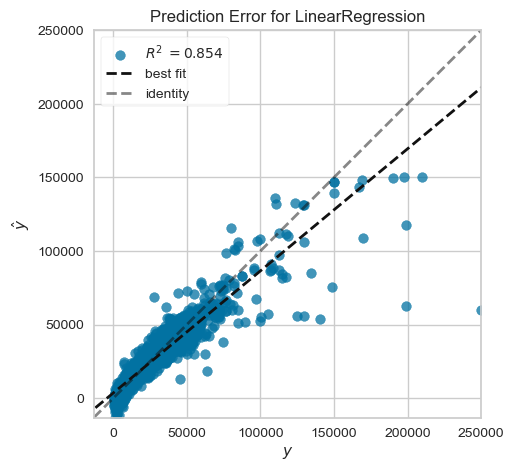

In [82]:
from yellowbrick.regressor import PredictionError
from yellowbrick.features import RadViz

visualizer = RadViz(size=(500, 1000))
model = LinearRegression()
visualizer = PredictionError(model)
visualizer.fit(X_train_scaled, y_train) # Fit the training data to the visualizer
visualizer.score(X_test_scaled, y_test) # Evaluate the model on the test data
visualizer.show();

# From prediciton error chart, we can see how good our model's predictions are. When we look at the image below,
# we can see that cars with prices of 70 thousand EURO and above are pulling our best fit line down.
# If I drop the very low-priced cars that I see from the data that break my scores,
# the cars with 70 thousand EURO and above, or the outlier-priced cars that I have determined on
# the basis of models from my data and retrain the model from this data, I can get better scores.

# We will continue to drop cars with very low prices and cars over 70.000 EURO in this notebook.

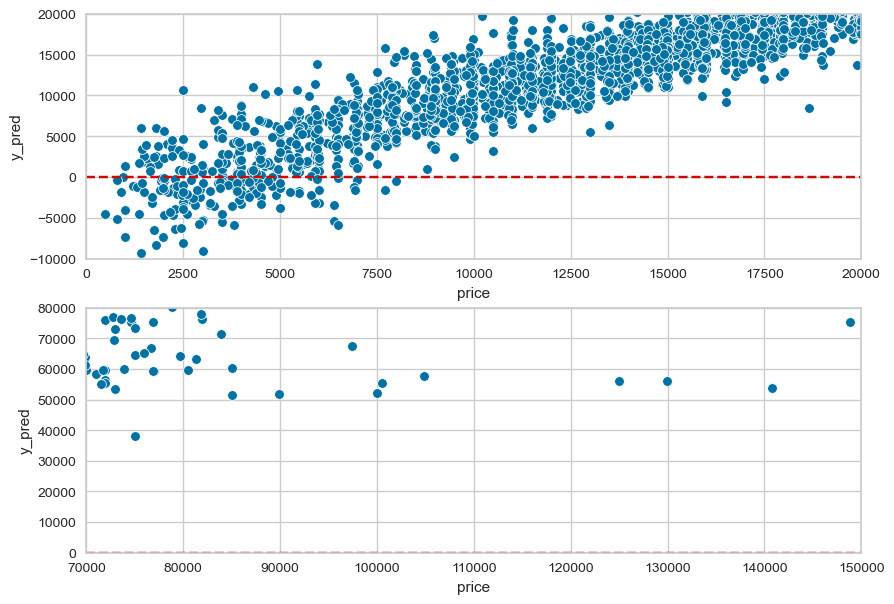

In [83]:
y_pred=lm.predict(X_test_scaled)


plt.figure(figsize=(10,7))
plt.subplot(211)

sns.scatterplot(x = y_test, y = y_pred) #-residuals
plt.axhline(y = 0, color ="r", linestyle = "--")
plt.ylabel("y_pred")
plt.xlim([0,20000])
plt.ylim([-10000,20000])

plt.subplot(212)

sns.scatterplot(x = y_test, y = y_pred) #-residuals
plt.axhline(y = 0, color ="r", linestyle = "--")
plt.ylabel("y_pred")
plt.xlim([70000, 150000])
plt.ylim([0,80000])
plt.show();

# We see that our model does not learn well about the car prices of 7500 EURO and below and over 70 thousand EURO.
# The question that immediately comes to our mind should be: What is the distribution of car prices below 7500 EURO
# and above 70 thousand EURO in the residual plot? We will look at the residual plot below and see
# if linear regression is a good choice for the determination of the car prices we mentioned.

### Residual Plot with Outliers

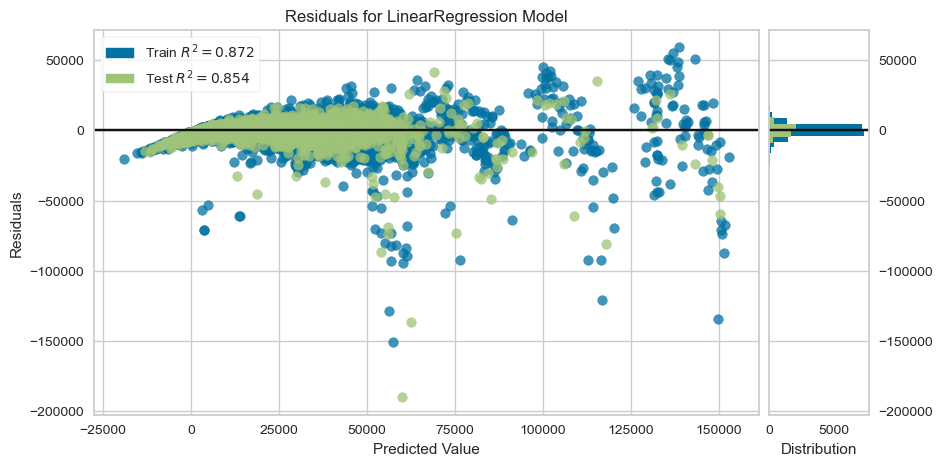

In [84]:
from yellowbrick.regressor import ResidualsPlot

visualizer = RadViz(size=(1000, 500))
model = LinearRegression()
visualizer = ResidualsPlot(model)

visualizer.fit(X_train_scaled, y_train) # Fit the training data to the visualizer
visualizer.score(X_test_scaled, y_test) # Evaluate the model on the test data
visualizer.show();

# The data from the residual plot clearly shows that linear regression is not suitable for cheap and high priced cars.

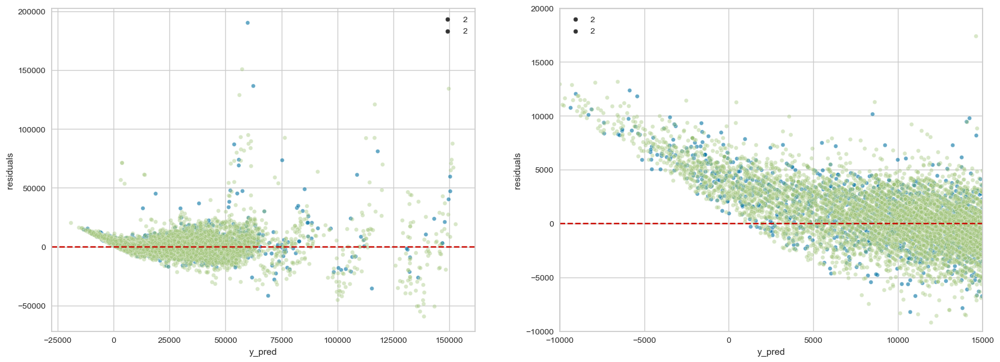

In [85]:
y_pred=lm.predict(X_test_scaled)
y_pred_train = lm.predict(X_train_scaled)

residual_test = y_test-y_pred
residual_train = y_train-y_pred_train

plt.figure(figsize=(20,7))
plt.subplot(121)

sns.scatterplot(x = y_pred, y = residual_test, palette="deep", size=2, alpha=0.6)
sns.scatterplot(x = y_pred_train, y = residual_train, size=2, alpha=0.4)

plt.axhline(y = 0, color ="r", linestyle = "--")
plt.ylabel("residuals")
plt.xlabel("y_pred")

plt.subplot(122)

sns.scatterplot(x = y_pred, y = residual_test, palette="deep", size=2, alpha=0.6)
sns.scatterplot(x = y_pred_train, y = residual_train, size=2, alpha=0.4)

plt.axhline(y = 0, color ="r", linestyle = "--")
plt.ylabel("residuals")
plt.xlabel("y_pred")
plt.xlim([-10000,15000])
plt.ylim([-10000,20000])
plt.show();

# When we look at the residuals plot, we can see that the problem is that low-priced cars and high-priced cars
# that do not have a balanced distribution around the 0 axis disrupt the distribution in the residual plot.

# For this, we will drop the cars below 7500 EURO and above 70 thousand EURO,
# which the model made bad predictions above, from our data.
# Then we will observe our scores again.

## Filtering Data and Rebuilding The Model

In [86]:
df = df[(df.price > 7500)&(df.price <70000)]
df

,make_model,price,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
0,Mercedes-Benz A 45 AMG,69900.000,Compact,Used,Yes,18900.000,Automatic,Benzine,Dealer,1991.000,8.000,162.000,4WD,1,1555.000,No,Part/Full Leather,2.000,unefficient,2.000,310.000,8.400,Standard,Standard,Safety Premium Plus Package
1,Mercedes-Benz A 35 AMG,46990.000,Compact,Used,Yes,18995.000,Automatic,Benzine,Dealer,1991.000,7.000,169.000,4WD,1,1455.000,No,Part/Full Leather,2.000,unefficient,2.000,225.000,7.300,Standard,Standard,Safety Premium Package
2,Mercedes-Benz A 45 AMG,16800.000,Compact,Used,Yes,197000.000,Automatic,Diesel,Dealer,2143.000,7.000,162.000,4WD,1,1545.000,No,Part/Full Leather,2.000,unefficient,7.000,100.000,4.900,Standard,Standard,Safety Premium Plus Package
3,Mercedes-Benz CLA 180,22550.000,Compact,Used,Yes,83339.000,Manual,Diesel,Dealer,1595.000,7.000,134.000,Front,3,1410.000,No,Part/Full Leather,3.000,unefficient,4.000,90.000,6.100,Standard,Plus,Safety Premium Package
4,Mercedes-Benz A 220,26900.000,Compact,Used,Yes,48900.000,Automatic,Benzine,Dealer,1991.000,7.000,141.000,Front,2,1450.000,No,Part/Full Leather,2.000,efficient,3.000,140.000,6.100,Standard,Standard,Safety Premium Package
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23227,Volvo S90,27190.000,Sedan,Used,Yes,93757.000,Automatic,Diesel,Dealer,1969.000,8.000,127.000,Front,1,1683.000,No,Part/Full Leather,1.000,efficient,4.000,140.000,4.400,Standard,Standard,Safety Premium Plus Package
23228,Volvo S90,27190.000,Sedan,Used,Yes,93757.000,Automatic,Diesel,Dealer,1969.000,8.000,127.000,Front,1,1683.000,No,Part/Full Leather,1.000,efficient,4.000,140.000,4.400,Standard,Standard,Safety Premium Plus Package
23229,Volvo V40,13000.000,Sedan,Used,No,114000.000,Manual,Diesel,Private seller,1969.000,6.000,94.000,Front,9,1532.000,Yes,Cloth,1.000,efficient,4.000,88.000,3.600,Standard,Standard,Safety Premium Package
23231,Volvo S90,37600.000,Sedan,Used,Yes,40345.000,Automatic,Diesel,Dealer,1969.000,8.000,127.000,4WD,1,2077.000,No,Part/Full Leather,2.000,efficient,3.000,288.000,2.000,Standard,Standard,Safety Premium Plus Package


In [87]:
X = df.drop(columns = "price")
y = df.price

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# After dropping outlier observations, we divide the remaining data into X and y and divide it into train and test sets.

In [88]:
X_train= column_trans.fit_transform(X_train)
X_test= column_trans.transform(X_test)

In [89]:
X_train.head()

,make_model_Dacia Dokker,make_model_Dacia Duster,make_model_Dacia Jogger,make_model_Dacia Lodgy,make_model_Dacia Logan,make_model_Dacia Sandero,make_model_Dacia Spring,make_model_Fiat 124 Spider,make_model_Fiat 500,make_model_Fiat 500 Abarth,make_model_Fiat 500C,make_model_Fiat 500L,make_model_Fiat 500X,make_model_Fiat 500e,make_model_Fiat Panda,make_model_Fiat Punto,make_model_Fiat Punto Evo,make_model_Fiat Tipo,make_model_Ford EcoSport,make_model_Ford Edge,make_model_Ford Fiesta,make_model_Ford Focus,make_model_Ford Ka/Ka+,make_model_Ford Kuga,make_model_Ford Mondeo,make_model_Ford Mustang,make_model_Ford Puma,make_model_Ford Ranger,make_model_Hyundai BAYON,make_model_Hyundai Coupe,make_model_Hyundai ELANTRA,make_model_Hyundai Genesis,make_model_Hyundai IONIQ,make_model_Hyundai KONA,make_model_Hyundai SANTA FE,make_model_Hyundai TUCSON,make_model_Hyundai VELOSTER,make_model_Hyundai i10,make_model_Hyundai i20,make_model_Hyundai i30,make_model_Hyundai i40,make_model_Hyundai iX20,make_model_Hyundai iX35,make_model_Mercedes-Benz A 180,make_model_Mercedes-Benz A 200,make_model_Mercedes-Benz A 220,make_model_Mercedes-Benz A 250,make_model_Mercedes-Benz A 35 AMG,make_model_Mercedes-Benz A 45 AMG,make_model_Mercedes-Benz C 180,make_model_Mercedes-Benz C 200,make_model_Mercedes-Benz C 220,make_model_Mercedes-Benz C 250,make_model_Mercedes-Benz C 300,make_model_Mercedes-Benz C 400,make_model_Mercedes-Benz C 43 AMG,make_model_Mercedes-Benz C 63 AMG,make_model_Mercedes-Benz CL,make_model_Mercedes-Benz CLA 180,make_model_Mercedes-Benz CLA 200,make_model_Mercedes-Benz CLA 45 AMG,make_model_Mercedes-Benz CLS 350,make_model_Mercedes-Benz E 200,make_model_Mercedes-Benz E 220,make_model_Mercedes-Benz E 250,make_model_Mercedes-Benz E 300,make_model_Mercedes-Benz E 350,make_model_Mercedes-Benz E 400,make_model_Mercedes-Benz E 53 AMG,make_model_Mercedes-Benz E 63 AMG,make_model_Mercedes-Benz GLC 220,make_model_Mercedes-Benz GLC 250,make_model_Mercedes-Benz GLC 300,make_model_Mercedes-Benz GLC 43 AMG,make_model_Mercedes-Benz GLC 63 AMG,make_model_Mercedes-Benz S 500,make_model_Mercedes-Benz SLK 200,make_model_Nissan 350Z,make_model_Nissan 370Z,make_model_Nissan GT-R,make_model_Nissan Juke,make_model_Nissan Leaf,make_model_Nissan Micra,make_model_Nissan Murano,make_model_Nissan NV200,make_model_Nissan Note,make_model_Nissan Pulsar,make_model_Nissan Qashqai,make_model_Nissan Townstar,make_model_Nissan X-Trail,make_model_Opel Adam,make_model_Opel Astra,make_model_Opel Cascada,make_model_Opel Corsa,make_model_Opel Crossland,make_model_Opel Crossland X,make_model_Opel GT,make_model_Opel Grandland,make_model_Opel Grandland X,make_model_Opel Insignia,make_model_Opel Mokka,make_model_Opel Mokka X,make_model_Opel Tigra,make_model_Peugeot 107,make_model_Peugeot 108,make_model_Peugeot 2008,make_model_Peugeot 206,make_model_Peugeot 207,make_model_Peugeot 208,make_model_Peugeot 3008,make_model_Peugeot 307,make_model_Peugeot 308,make_model_Peugeot 407,make_model_Peugeot 5008,make_model_Peugeot 508,make_model_Peugeot RCZ,make_model_Renault Alpine A110,make_model_Renault Arkana,make_model_Renault Captur,make_model_Renault Clio,make_model_Renault Kadjar,make_model_Renault Koleos,make_model_Renault Laguna,make_model_Renault Megane,make_model_Renault Talisman,make_model_Renault Twingo,make_model_Renault Wind,make_model_Renault ZOE,make_model_SEAT Arona,make_model_SEAT Ateca,make_model_SEAT Ibiza,make_model_SEAT Leon,make_model_SEAT Mii,make_model_SEAT Tarraco,make_model_Skoda Citigo,make_model_Skoda Fabia,make_model_Skoda Kamiq,make_model_Skoda Karoq,make_model_Skoda Kodiaq,make_model_Skoda Octavia,make_model_Skoda Rapid/Spaceback,make_model_Skoda Scala,make_model_Skoda Superb,make_model_Toyota Auris,make_model_Toyota Avensis,make_model_Toyota Aygo,make_model_Toyota Aygo X,make_model_Toyota C-HR,make_model_Toyota Corolla,make_model_Toyota GT86,make_model_Toyota Hilux,make_model_Toyota Land Cruiser,make_model_Toyota MR 2,make_model_Toyota Prius,make_model_Toyota RAV

In [90]:
X_test.head()

,make_model_Dacia Dokker,make_model_Dacia Duster,make_model_Dacia Jogger,make_model_Dacia Lodgy,make_model_Dacia Logan,make_model_Dacia Sandero,make_model_Dacia Spring,make_model_Fiat 124 Spider,make_model_Fiat 500,make_model_Fiat 500 Abarth,make_model_Fiat 500C,make_model_Fiat 500L,make_model_Fiat 500X,make_model_Fiat 500e,make_model_Fiat Panda,make_model_Fiat Punto,make_model_Fiat Punto Evo,make_model_Fiat Tipo,make_model_Ford EcoSport,make_model_Ford Edge,make_model_Ford Fiesta,make_model_Ford Focus,make_model_Ford Ka/Ka+,make_model_Ford Kuga,make_model_Ford Mondeo,make_model_Ford Mustang,make_model_Ford Puma,make_model_Ford Ranger,make_model_Hyundai BAYON,make_model_Hyundai Coupe,make_model_Hyundai ELANTRA,make_model_Hyundai Genesis,make_model_Hyundai IONIQ,make_model_Hyundai KONA,make_model_Hyundai SANTA FE,make_model_Hyundai TUCSON,make_model_Hyundai VELOSTER,make_model_Hyundai i10,make_model_Hyundai i20,make_model_Hyundai i30,make_model_Hyundai i40,make_model_Hyundai iX20,make_model_Hyundai iX35,make_model_Mercedes-Benz A 180,make_model_Mercedes-Benz A 200,make_model_Mercedes-Benz A 220,make_model_Mercedes-Benz A 250,make_model_Mercedes-Benz A 35 AMG,make_model_Mercedes-Benz A 45 AMG,make_model_Mercedes-Benz C 180,make_model_Mercedes-Benz C 200,make_model_Mercedes-Benz C 220,make_model_Mercedes-Benz C 250,make_model_Mercedes-Benz C 300,make_model_Mercedes-Benz C 400,make_model_Mercedes-Benz C 43 AMG,make_model_Mercedes-Benz C 63 AMG,make_model_Mercedes-Benz CL,make_model_Mercedes-Benz CLA 180,make_model_Mercedes-Benz CLA 200,make_model_Mercedes-Benz CLA 45 AMG,make_model_Mercedes-Benz CLS 350,make_model_Mercedes-Benz E 200,make_model_Mercedes-Benz E 220,make_model_Mercedes-Benz E 250,make_model_Mercedes-Benz E 300,make_model_Mercedes-Benz E 350,make_model_Mercedes-Benz E 400,make_model_Mercedes-Benz E 53 AMG,make_model_Mercedes-Benz E 63 AMG,make_model_Mercedes-Benz GLC 220,make_model_Mercedes-Benz GLC 250,make_model_Mercedes-Benz GLC 300,make_model_Mercedes-Benz GLC 43 AMG,make_model_Mercedes-Benz GLC 63 AMG,make_model_Mercedes-Benz S 500,make_model_Mercedes-Benz SLK 200,make_model_Nissan 350Z,make_model_Nissan 370Z,make_model_Nissan GT-R,make_model_Nissan Juke,make_model_Nissan Leaf,make_model_Nissan Micra,make_model_Nissan Murano,make_model_Nissan NV200,make_model_Nissan Note,make_model_Nissan Pulsar,make_model_Nissan Qashqai,make_model_Nissan Townstar,make_model_Nissan X-Trail,make_model_Opel Adam,make_model_Opel Astra,make_model_Opel Cascada,make_model_Opel Corsa,make_model_Opel Crossland,make_model_Opel Crossland X,make_model_Opel GT,make_model_Opel Grandland,make_model_Opel Grandland X,make_model_Opel Insignia,make_model_Opel Mokka,make_model_Opel Mokka X,make_model_Opel Tigra,make_model_Peugeot 107,make_model_Peugeot 108,make_model_Peugeot 2008,make_model_Peugeot 206,make_model_Peugeot 207,make_model_Peugeot 208,make_model_Peugeot 3008,make_model_Peugeot 307,make_model_Peugeot 308,make_model_Peugeot 407,make_model_Peugeot 5008,make_model_Peugeot 508,make_model_Peugeot RCZ,make_model_Renault Alpine A110,make_model_Renault Arkana,make_model_Renault Captur,make_model_Renault Clio,make_model_Renault Kadjar,make_model_Renault Koleos,make_model_Renault Laguna,make_model_Renault Megane,make_model_Renault Talisman,make_model_Renault Twingo,make_model_Renault Wind,make_model_Renault ZOE,make_model_SEAT Arona,make_model_SEAT Ateca,make_model_SEAT Ibiza,make_model_SEAT Leon,make_model_SEAT Mii,make_model_SEAT Tarraco,make_model_Skoda Citigo,make_model_Skoda Fabia,make_model_Skoda Kamiq,make_model_Skoda Karoq,make_model_Skoda Kodiaq,make_model_Skoda Octavia,make_model_Skoda Rapid/Spaceback,make_model_Skoda Scala,make_model_Skoda Superb,make_model_Toyota Auris,make_model_Toyota Avensis,make_model_Toyota Aygo,make_model_Toyota Aygo X,make_model_Toyota C-HR,make_model_Toyota Corolla,make_model_Toyota GT86,make_model_Toyota Hilux,make_model_Toyota Land Cruiser,make_model_Toyota MR 2,make_model_Toyota Prius,make_model_Toyota RAV

In [91]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [92]:
lm2 = LinearRegression()
lm2.fit(X_train_scaled, y_train)

LinearRegression()

In [93]:
train_val(lm2, X_train_scaled, y_train, X_test_scaled, y_test)

,train,test
R2,0.886,0.892
mae,2722.012,2714.950
mse,15585114.495,14855738.548
rmse,3947.799,3854.314
mape,0.136,0.136


### Prediction Error without Outliers

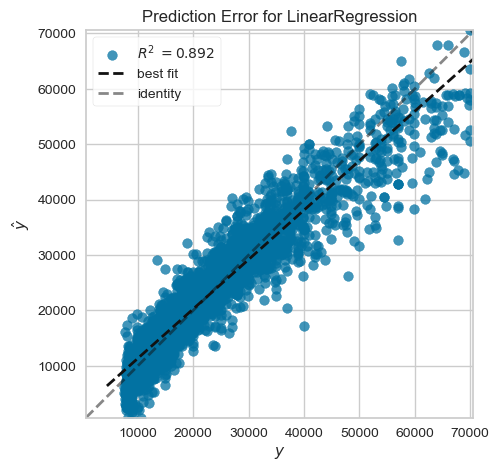

In [94]:
visualizer = RadViz(size=(500, 1000))
model = LinearRegression()
visualizer = PredictionError(model)
visualizer.fit(X_train_scaled, y_train) # Fit the training data to the visualizer
visualizer.score(X_test_scaled, y_test) # Evaluate the model on the test data
visualizer.show();

# After removing the outlier values, we see that the angle between the best fit line and
# the identity line narrows even more.

### Residual Plot without Outliers

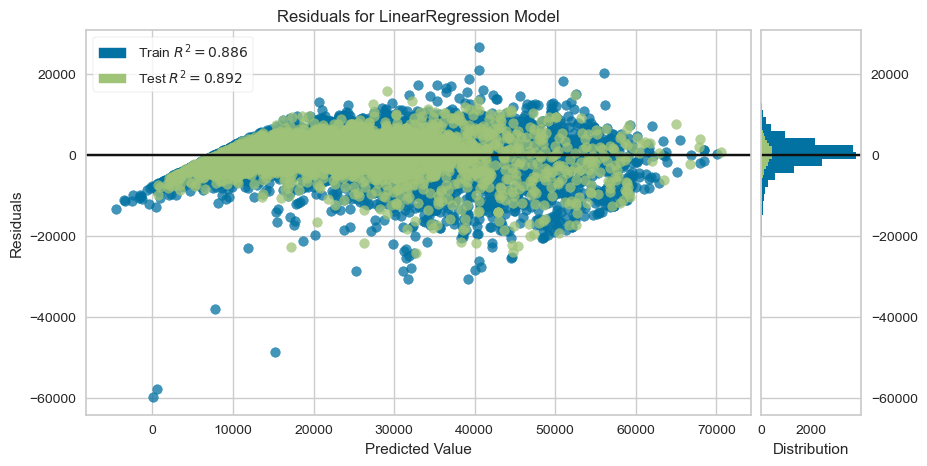

In [95]:
from yellowbrick.regressor import ResidualsPlot

visualizer = RadViz(size=(1000, 500))
model = LinearRegression()
visualizer = ResidualsPlot(model)

visualizer.fit(X_train_scaled, y_train) # Fit the training data to the visualizer
visualizer.score(X_test_scaled, y_test) # Evaluate the model on the test data
visualizer.show();

# for cars priced at or around 7500 EURO, although our scores have improved
# still not suitable for linear regression.

In [96]:
model = LinearRegression()

scores = cross_validate(model,
                        X_train_scaled,
                        y_train,
                        scoring=['r2',
                                'neg_mean_absolute_error',
                                'neg_mean_squared_error',
                                'neg_root_mean_squared_error',
                                'neg_mean_absolute_percentage_error'],
                        cv =10,
                        return_train_score=True)

pd.DataFrame(scores).iloc[:, 2:].mean()

# We are checking overfitting according to our new data.
# Since train and test scores and error rates are close, we can say there is no overfitting.

test_r2                                            -54949923606986735616.000
train_r2                                                               0.887
test_neg_mean_absolute_error                               -711703105646.899
train_neg_mean_absolute_error                                      -2715.749
test_neg_mean_squared_error                -7646907737955898301163241472.000
train_neg_mean_squared_error                                   -15549715.912
test_neg_root_mean_squared_error                         -28537985615500.961
train_neg_root_mean_squared_error                                  -3943.252
test_neg_mean_absolute_percentage_error                        -13224940.276
train_neg_mean_absolute_percentage_error                              -0.135
dtype: float64

In [97]:
train_val(lm2, X_train_scaled, y_train, X_test_scaled, y_test)

# Since the test scores we will present to the customer and the validation scores we get from the CV are close
# to each other, we can say that the scores we get from the test (hold out) set are consistent scores.

,train,test
R2,0.886,0.892
mae,2722.012,2714.950
mse,15585114.495,14855738.548
rmse,3947.799,3854.314
mape,0.136,0.136


In [98]:
y_pred = lm2.predict(X_test_scaled)

lm_R2 = r2_score(y_test, y_pred)
lm_mae = mean_absolute_error(y_test, y_pred)
lm_rmse = mean_squared_error(y_test, y_pred, squared=False)
lm_mape= mean_absolute_percentage_error(y_test, y_pred)

# We assign the scores to the variables to compare the scores we get from the linear model.

In [99]:
pd.DataFrame(lm2.coef_, index = X_train.columns, columns=["Coef"])
 # The coefficients of the features with onehot encoder applied are very high. Dummy variable trap

# https://geoffruddock.com/one-hot-encoding-plus-linear-regression-equals-multi-collinearity/

# Dummy variable trap is a problem that occurs when the independent variables used in regression analysis are related
# to each other. This can occur as a result of deriving or extracting one argument from other arguments.

# Especially in multiple linear regression models, it is thought that all independent variables should be
# included in the model.
# However, when there is an exact relationship between some independent variables
# (that is, if a variable can be derived from the sum of other variables),
# problems may arise with the accuracy of the model. This may also be reflected in the significantly
# higher correlations in the correlation matrix of the independent variables.

# Dummy variable trap may occur, especially when adding categorical variables to models.
# Categorical variables, such as "gender" or "country", are often converted to dummy variables
# when added to the model. This means, for example, creating two different dummy variables
# "male" and "female" for the "gender" variable. However, in this case, the addition of both variables
# to the model may cause problems as they are variables that can be derived from each other.
# This occurs when a dummy variable can be derived from the sum of other dummy variables.

# In order to reduce the effect of the dummy variable trap, when transforming the unique categorical observations
# under each featura into dummies features, it can be eliminated by dropping 1 of these observations or
# applying regularization.

# The drop="first" parameter in the code OneHotEncoder(handle_unknown="ignore", sparse=False, drop="first"), cat_onehot)
# drops 1 unique categorical observation in each featur and is among the new dummies features.
# weakens the relationship. but drop="first" is not used when feature importance is to be made.
# Regularization is preferred.

,Coef
make_model_Dacia Dokker,-99159903724888.422
make_model_Dacia Duster,-99159903725306.156
make_model_Dacia Jogger,-99159903724986.953
make_model_Dacia Lodgy,-99159903725870.531
make_model_Dacia Logan,-99159903726119.000
make_model_Dacia Sandero,-99159903728449.875
make_model_Dacia Spring,-99159903728594.656
make_model_Fiat 124 Spider,-99159903723817.938
make_model_Fiat 500,-99159903727003.094
make_model_Fiat 500 Abarth,-99159903723358.375


## Pipeline

In [100]:
X = df.drop(columns = ["price"])
y = df.price

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# After dropping outlier observations, we divide the remaining data into X and y and divide it into train and test sets.

In [101]:
X_train.head()

,make_model,body_type,type,warranty,mileage,gearbox,fuel_type,seller,engine_size,gears,co_emissions,drivetrain,extras,empty_weight,full_service_history,upholstery,previous_owner,energy_efficiency_class,age,power_kW,cons_avg,comfort_&_convenience_Package,entertainment_&_media_Package,safety_&_security_Package
5460,Renault Clio,Sedan,Used,Yes,97540.000,Manual,Benzine,Dealer,1149.000,5.000,127.000,Front,2,1157.000,No,Cloth,2.000,unefficient,6.000,54.000,5.100,Standard,Standard,Safety Premium Package
13438,Dacia Duster,Off-Road/Pick-up,Used,Yes,31261.000,Manual,Benzine,Dealer,1598.000,5.000,156.000,Front,4,1240.000,No,Cloth,1.000,unefficient,3.000,84.000,6.800,Premium,Standard,Safety Premium Package
138,Mercedes-Benz A 200,Compact,Used,Yes,67953.000,Automatic,Benzine,Dealer,1332.000,7.000,0.000,Front,4,1275.000,Yes,Part/Full Leather,2.000,efficient,4.000,121.000,5.200,Standard,Plus,Safety Premium Package
3121,Opel Astra,Station wagon,Used,Yes,84750.000,Manual,Diesel,Dealer,1598.000,6.000,89.000,Front,2,1293.000,No,Cloth,1.000,efficient,4.000,81.000,4.000,Premium,Plus,Safety Premium Package
22353,Volvo XC60,Off-Road/Pick-up,Pre-registered,Yes,9.000,Automatic,Diesel,Dealer,1969.000,8.000,142.000,Front,1,1843.000,No,Part/Full Leather,1.000,efficient,0.000,145.000,0.000,Standard,Plus,Safety Premium Plus Package


In [102]:
cat_onehot = ['make_model', 'body_type', 'warranty', 'gearbox', 'fuel_type', 'seller', 'drivetrain', 'full_service_history',
              'upholstery', 'energy_efficiency_class']
cat_ordinal = ['type', 'comfort_&_convenience_Package', 'entertainment_&_media_Package', 'safety_&_security_Package']

cat_for_type = ["Used", "Employee's car", "Demonstration", "Pre-registered"]
cat_for_comfort = ['Standard', 'Premium', 'Premium Plus']
cat_for_ent = ['Standard', 'Plus']
cat_for_safety = ['Safety Standard Package', 'Safety Premium Package', 'Safety Premium Plus Package']

In [103]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

enc_onehot = OneHotEncoder(handle_unknown="ignore", sparse_output=False)
enc_ordinal = OrdinalEncoder(categories= [cat_for_type, cat_for_comfort, cat_for_ent, cat_for_safety])

column_trans = make_column_transformer((enc_onehot, cat_onehot),
                                       (enc_ordinal, cat_ordinal),
                                        remainder='passthrough',
                                        verbose_feature_names_out=False) # MinMaxScaler()

In [104]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline

operations = [("OneHot_Ordinal_Encoder", column_trans),
              ("scaler", MinMaxScaler()),
              ("Ridge", Ridge())]

ridge_pipe = Pipeline(steps=operations).set_output(transform="pandas")
# If we want the outputs of the given transform algorithms to be dataframes,
# you can add set_output(transform="pandas") to the end of the pipeline.

ridge_pipe.fit(X_train, y_train)

#What happens can be described as follows:

#The data are split into TRAINING data and TEST data according to ratio of train_test_split

#Fit process:

#ridge_pipe.fit(X_train, y_train) Here, what does it do sequentially?

#Since the first operation to be performed in the ridge_pipe model is column_trans;

#a. One-hot encoder transformation is performed on the features in the train data that will be converted to one-hot encoder
#   (cat_onehot) according to the information of the train data.

#b. Ordinal encoder transformation is performed on the features in the train data that will be converted to ordinal encoder
#   (cat_ordinal) according to the information of the train data.

#c. No operation is performed on the numeric features other than the features that have been transformed. It is left as it is.
#  (Because remainder='passthrough')

#Since the second operation to be performed in the ridge_pipe model is MinMaxScaler();

#   Minmax scaling is applied to the new numeric train data obtained after the transformation, according to the min, max
#   information of the train data. Minmaxscale was applied so that the observations consisting of 0 and 1 in our data remain
#   0 and 1.

#Since the third operation to be performed in the ridge_pipe model is Ridge();

#   The transformed and scaled train data (X_train) is given to the Ridge model together with y_train, and the training is
#   completed.

#ridge_pipe.fit(X_train, y_train) --> columns_trans.fit_transform(X_train)
#                                 --> MinMaxScaler().fit_transform(X_train_trans)
#                                 --> Ridge.fit(X_train_trans_scaled, y_train)

#Predict process:

#ridge_pipe.predict(X_test) What does it do sequentially?

#Since the first operation to be performed in the ridge_pipe model is column_trans;

#a. One-hot encoder transformation is performed on the features in the test data that will be converted to one-hot encoder
#   (cat_onehot) according to the information of the train data.

#b. Ordinal encoder transformation is performed on the features in the test data that will be converted to ordinal encoder
#   (cat_ordinal) according to the information of the train data.

#c. No operation is performed on the numeric features other than the features that have been transformed in the test data.
#   It is left as it is. (Because remainder='passthrough')

#Since the second operation to be performed in the ridge_pipe model is MinMaxScaler();

#   Minmax scaling is applied to the new numeric test data obtained after the transformation, according to the min, max
#   information of the train data.

#Since the third operation to be performed in the ridge_pipe model is Ridge();

#   The transformed and scaled test data is predicted by the Ridge model according to the information of the train data.

#ridge_pipe.predict(X_test)  --> columns_trans.transform(X_test)
#                            --> MinMaxScaler().transform(X_test_trans)
#                            --> Ridge.predict(X_test_trans_scaled)

#Pipeline automates our processes as described here.

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                              'Pre-registered'],
                                                                             ['Standard',
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('scaler', MinMaxScaler()), ('Ridge', Ridge())])

## Implement Ridge Regression

- Import the modul
- Do not forget to scale the data or use Normalize parameter as True
- Fit the model
- Predict the test set
- Evaluate model performance (use performance metrics for regression)
- Tune alpha hiperparameter by using [cross validation](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.RidgeCV.html) and determine the optimal alpha value.
- Fit the model and predict again with the new alpha value.

## Ridge

In [527]:
from sklearn.linear_model import Ridge

In [528]:
operations = [("OneHot_Ordinal_Encoder", column_trans), ("scaler", MinMaxScaler()), ("Ridge", Ridge())]

ridge_model = Pipeline(steps=operations)
ridge_model.fit(X_train, y_train)

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                              'Pre-registered'],
                                                                             ['Standard',
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('scaler', MinMaxScaler()), ('Ridge', Ridge())])

In [529]:
train_val(ridge_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.880,0.876
mae,2580.597,2494.097
mse,14151070.361,13451576.956
rmse,3761.791,3667.639
mape,0.131,0.130


## Cross Validation

In [530]:
operations = [("OneHot_Ordinal_Encoder", column_trans),
              ("scaler", MinMaxScaler()),
              ("Ridge", Ridge())]

pipe_model = Pipeline(steps=operations)

scores = cross_validate(pipe_model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv=10,
                        return_train_score=True)

# Very important note: If you are doing a conversion to your data, make sure to use the pipeline in the CV process,
# otherwise the data leakage problem may occur.

# Since the use of a data that has been transformed into a CV will also cause data leakage,
# the original version of the data will be given to the CV, and the new train and new test sets in
# each iteration will be converted into numeric form in accordance with the pipeline steps and
# their scores will be taken in the CV.

# Remember that you have to do the CV process we did in the linear regression model with the pipeline.

In [531]:
scores = pd.DataFrame(scores, index = range(1, 11))
scores

,fit_time,score_time,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error
1,0.102,0.018,0.883,0.879,-2658.957,-2568.947,-14695140.172,-14110509.582,-3833.424,-3756.396,-0.130,-0.131
2,0.059,0.012,0.875,0.880,-2644.624,-2578.419,-14200638.401,-14172161.687,-3768.373,-3764.593,-0.136,-0.131
3,0.058,0.011,0.888,0.879,-2526.844,-2590.221,-13129075.998,-14277303.295,-3623.407,-3778.532,-0.130,-0.132
4,0.058,0.012,0.868,0.881,-2736.980,-2563.247,-17295570.947,-13839087.173,-4158.794,-3720.092,-0.134,-0.131
5,0.059,0.011,0.877,0.880,-2567.522,-2584.421,-13048905.980,-14285706.923,-3612.327,-3779.644,-0.132,-0.131
6,0.059,0.011,0.869,0.881,-2613.076,-2580.932,-14492993.080,-14126754.708,-3806.966,-3758.558,-0.137,-0.131
7,0.059,0.011,0.889,0.879,-2462.751,-2597.637,-12488053.821,-14346211.347,-3533.844,-3787.639,-0.126,-0.132
8,0.059,0.011,0.878,0.880,-2586.415,-2583.629,-13763608.777,-14209085.381,-3709.934,-3769.494,-0.131,-0.131
9,0.059,0.005,0.883,0.879,-2631.113,-2571.970,-14728231.044,-14104909.728,-3837.738,-3755.650,-0.131,-0.131
10,0.069,0.013,0.860,0.882,-2603.948,-2577.542,-16545749.219,-13899005.697,-4067.647,-3728.137,-0.134,-0.131


In [532]:
scores.iloc[:,2:].mean()

test_r2                                            0.877
train_r2                                           0.880
test_neg_mean_absolute_error                   -2603.223
train_neg_mean_absolute_error                  -2579.696
test_neg_mean_squared_error                -14438796.744
train_neg_mean_squared_error               -14137073.552
test_neg_root_mean_squared_error               -3795.245
train_neg_root_mean_squared_error              -3759.874
test_neg_mean_absolute_percentage_error           -0.132
train_neg_mean_absolute_percentage_error          -0.131
dtype: float64

## Finding best alpha for Ridge

In [533]:
from sklearn.model_selection import GridSearchCV

In [534]:
alpha_space = np.linspace(0.001, 100, 100)

In [535]:
operations = [("OneHot_Ordinal_Encoder", column_trans),
              ("scaler", MinMaxScaler()),
              ("Ridge", Ridge())]

pipe_model = Pipeline(steps=operations)

param_grid = {'Ridge__alpha': alpha_space} # Parameter names should be used together with the model name defined
                                           # in the pipeline.

ridge_grid_model = GridSearchCV(estimator=pipe_model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs=-1,
                          return_train_score=True)

# Very important note: If you are doing a transformation to your data, make sure to use pipeline in gridsearch operation,
# otherwise data leakage problem may occur.

# Since the use of a transformed data in gridsearch will also cause data leakage, the original state of
# the data will be given to gridsearch, and the new train and new test sets in each iteration
# will be converted into numeric form in accordance with the pipeline steps and their scores will be taken in gridsearch.

# Remember that you have to do the gridsearch operation that we did in the linear regression model with the pipeline.

In [536]:
pipe_model.get_params() # to see the parameters of the model defined with pipeline

{'memory': None,
 'steps': [('OneHot_Ordinal_Encoder',
   ColumnTransformer(remainder='passthrough',
                     transformers=[('onehotencoder',
                                    OneHotEncoder(handle_unknown='ignore',
                                                  sparse_output=False),
                                    ['make_model', 'body_type', 'warranty',
                                     'gearbox', 'fuel_type', 'seller',
                                     'drivetrain', 'full_service_history',
                                     'upholstery', 'energy_efficiency_class']),
                                   ('ordinalencoder',
                                    OrdinalEncoder(categories=[['Used',
                                                                "Employee's car",
                                                                'Demonstration',
                                                                'Pre-registered'],
                         

In [537]:
ridge_grid_model.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHot_Ordinal_Encoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         ['make_model',
                                                                          'body_type',
                                                                          'warranty',
                                                                          'gearbox',
                                                                          'fuel_type',
                                                                          'seller',
                                                                          'drivetrain',
                                                                          'full_service_history',
                                                                          'upholstery',
                                                                          'energy_efficiency_class']),
                                                                        ('...
       8.08082727e+01, 8.18183636e+01, 8.28284545e+01, 8.38385455e+01,
       8.48486364e+01, 8.58587273e+01, 8.68688182e+01, 8.78789091e+01,
       8.88890000e+01, 8.98990909e+01, 9.09091818e+01, 9.19192727e+01,
       9.29293636e+01, 9.39394545e+01, 9.49495455e+01, 9.59596364e+01,
       9.69697273e+01, 9.79798182e+01, 9.89899091e+01, 1.00000000e+02])},
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [538]:
ridge_grid_model.best_estimator_

# hyper returns only values other than default from parameters. If our best alpha after gridsearch was 1,
# it wouldn't show 1 here.

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                             ['Standard',
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('scaler', MinMaxScaler()),
                ('Ridge', Ridge(alpha=1.011090909090909))])

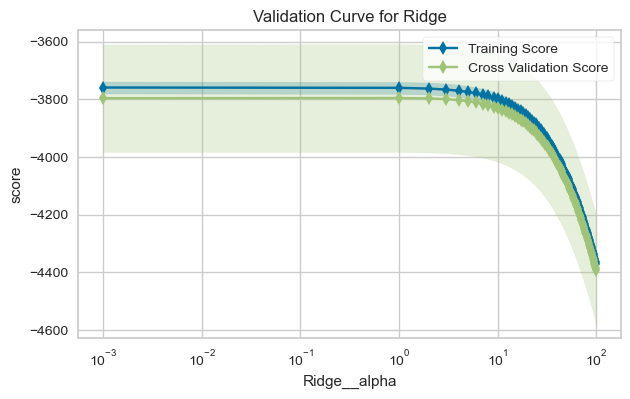

<Axes: title={'center': 'Validation Curve for Ridge'}, xlabel='Ridge__alpha', ylabel='score'>

In [539]:
from yellowbrick.model_selection import ValidationCurve
viz = ValidationCurve(
    pipe_model, param_name="Ridge__alpha", param_range=np.linspace(0.001, 100, 100),
    logx=True, cv=10, scoring="neg_root_mean_squared_error", n_jobs=-1,
)

viz.fit(X_train, y_train)
viz.show()

In [540]:
pd.DataFrame(ridge_grid_model.cv_results_).loc[ridge_grid_model.best_index_, ["mean_test_score", "mean_train_score"]]

mean_test_score    -3795.252
mean_train_score   -3759.896
Name: 1, dtype: object

In [541]:
train_val(ridge_grid_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.880,0.876
mae,2580.586,2494.074
mse,14151208.368,13451632.105
rmse,3761.809,3667.647
mape,0.131,0.130


In [542]:
y_pred = ridge_grid_model.predict(X_test)
rm_R2 = r2_score(y_test, y_pred)
rm_mae = mean_absolute_error(y_test, y_pred)
rm_rmse = mean_squared_error(y_test, y_pred, squared=False)
rm_mape= mean_absolute_percentage_error(y_test, y_pred)

In [543]:
ridge_grid_model.best_estimator_["Ridge"].coef_

array([ -1605.30230411,  -3179.68387612,  -4690.69362163,  -2762.97338276,
         -609.21793943,   -615.73167661,  -3225.24126199,  -3672.10108082,
        -3122.26080664,  -1390.80214222,   -254.77664978,   -640.06715574,
        -4671.73135723,   -541.78022592,   2383.76701713,  -3197.38492714,
        -2689.54548634,   4591.68827754,  -4136.65182793,  -7620.69549834,
        -1229.41845685,  -3758.47932   ,  -2648.9647671 ,   1240.27169909,
          912.08113836,  -4080.98594397,  -3345.62793543,  -1256.88001856,
        -4279.9445379 ,   -173.00177709,  -2055.19490982,    396.98978006,
         2303.91156177,  -1470.74328893,  -2118.57094969,   3284.16475196,
         -459.59492606,   3391.09989662,   -218.01381071,   -919.13285177,
        -2422.17575412,   -198.15012439,   -673.80391592,   -574.98271762,
        -1018.78653077,   2172.93768761,  -2707.68551004,  -2420.15985481,
        -2931.03134187,   4254.62300042,   8235.48354163,    -79.5466889 ,
        -2025.87051976,  

In [544]:
ridge_grid_model.best_estimator_["OneHot_Ordinal_Encoder"].get_feature_names_out()

array(['make_model_Dacia Duster', 'make_model_Dacia Logan',
       'make_model_Dacia Sandero', 'make_model_Fiat 500',
       'make_model_Fiat 500C', 'make_model_Fiat 500X',
       'make_model_Fiat Panda', 'make_model_Fiat Tipo',
       'make_model_Ford Fiesta', 'make_model_Ford Focus',
       'make_model_Ford Kuga', 'make_model_Ford Mondeo',
       'make_model_Ford Mustang', 'make_model_Hyundai IONIQ',
       'make_model_Hyundai TUCSON', 'make_model_Hyundai i20',
       'make_model_Hyundai i30', 'make_model_Mercedes-Benz A 180',
       'make_model_Nissan 350Z', 'make_model_Nissan 370Z',
       'make_model_Nissan Juke', 'make_model_Nissan Micra',
       'make_model_Nissan Pulsar', 'make_model_Nissan Qashqai',
       'make_model_Nissan X-Trail', 'make_model_Opel Adam',
       'make_model_Opel Astra', 'make_model_Opel Cascada',
       'make_model_Opel Corsa', 'make_model_Opel Grandland X',
       'make_model_Opel Insignia', 'make_model_Peugeot 2008',
       'make_model_Peugeot 206', 'make

In [545]:
pd.DataFrame(data= ridge_grid_model.best_estimator_["Ridge"].coef_,
             index=ridge_grid_model.best_estimator_["OneHot_Ordinal_Encoder"].get_feature_names_out(),
             columns=["Coef"]).sort_values("Coef")

# In order to get the coefficients and feature names, the model and encoder name you know through
# the model created with the pipeline should be used as a key.

,Coef
mileage,-22037.201
age,-19896.248
make_model_Nissan 370Z,-7620.695
make_model_Dacia Sandero,-4690.694
make_model_Ford Mustang,-4671.731
make_model_Opel Corsa,-4279.945
make_model_Toyota Aygo,-4195.188
make_model_Nissan 350Z,-4136.652
make_model_Opel Adam,-4080.986
make_model_Nissan Micra,-3758.479


## 5. Implement Lasso Regression

- Import the modul
- Do not forget to scale the data or use Normalize parameter as True(If needed)
- Fit the model
- Predict the test set
- Evaluate model performance (use performance metrics for regression)
- Tune alpha hyperparameter by using [cross validation](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoCV.html) and determine the optimal alpha value.
- Fit the model and predict again with the new alpha value.
- Compare different evaluation metrics

*Note: To understand the importance of the alpha hyperparameter, you can observe the effects of different alpha values on feature coefficants.*

In [546]:
from sklearn.linear_model import Lasso

In [547]:
operations = [("OneHot_Ordinal_Encoder", column_trans), ("scaler", MinMaxScaler()), ("Lasso", Lasso())]

lasso_model = Pipeline(steps=operations)

lasso_model.fit(X_train, y_train)

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                              'Pre-registered'],
                                                                             ['Standard',
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('scaler', MinMaxScaler()), ('Lasso', Lasso())])

In [548]:
train_val(lasso_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.879,0.876
mae,2583.070,2496.918
mse,14182019.829,13512776.406
rmse,3765.902,3675.973
mape,0.131,0.130


## Cross Validation

In [549]:
operations = [("OneHot_Ordinal_Encoder", column_trans),
              ("scaler", MinMaxScaler()),
              ("Lasso", Lasso())]

pipe_model = Pipeline(steps=operations)
scores = cross_validate(pipe_model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv=10,
                        return_train_score=True)

In [550]:
scores = pd.DataFrame(scores, index = range(1, 11))
scores.iloc[:,2:].mean()

test_r2                                            0.877
train_r2                                           0.880
test_neg_mean_absolute_error                   -2605.169
train_neg_mean_absolute_error                  -2582.291
test_neg_mean_squared_error                -14455439.985
train_neg_mean_squared_error               -14165184.339
test_neg_root_mean_squared_error               -3797.376
train_neg_root_mean_squared_error              -3763.609
test_neg_mean_absolute_percentage_error           -0.132
train_neg_mean_absolute_percentage_error          -0.131
dtype: float64

## Finding best alpha for Lasso

In [551]:
operations = [("OneHot_Ordinal_Encoder", column_trans),
              ("scaler", MinMaxScaler()),
              ("Lasso", Lasso())]

model = Pipeline(steps=operations)

param_grid = {'Lasso__alpha':alpha_space} # Parameter names should be used together with the model name defined in the pipeline.

lasso_grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs=-1,
                          return_train_score=True)

In [552]:
lasso_grid_model.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHot_Ordinal_Encoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         ['make_model',
                                                                          'body_type',
                                                                          'warranty',
                                                                          'gearbox',
                                                                          'fuel_type',
                                                                          'seller',
                                                                          'drivetrain',
                                                                          'full_service_history',
                                                                          'upholstery',
                                                                          'energy_efficiency_class']),
                                                                        ('...
       8.08082727e+01, 8.18183636e+01, 8.28284545e+01, 8.38385455e+01,
       8.48486364e+01, 8.58587273e+01, 8.68688182e+01, 8.78789091e+01,
       8.88890000e+01, 8.98990909e+01, 9.09091818e+01, 9.19192727e+01,
       9.29293636e+01, 9.39394545e+01, 9.49495455e+01, 9.59596364e+01,
       9.69697273e+01, 9.79798182e+01, 9.89899091e+01, 1.00000000e+02])},
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [553]:
lasso_grid_model.best_estimator_

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                              'Pre-registered'],
                                                                             ['Standard',
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('scaler', MinMaxScaler()), ('Lasso', Lasso(alpha=0.001))])

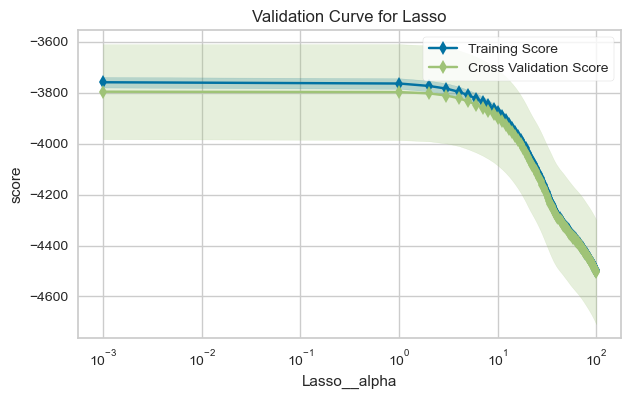

<Axes: title={'center': 'Validation Curve for Lasso'}, xlabel='Lasso__alpha', ylabel='score'>

In [554]:
viz = ValidationCurve(
    model, param_name="Lasso__alpha", param_range=np.linspace(0.001, 100, 100),
    logx=True, cv=10, scoring="neg_root_mean_squared_error", n_jobs=-1,
)

viz.fit(X_train, y_train)
viz.show()

In [555]:
pd.DataFrame(lasso_grid_model.cv_results_).loc[lasso_grid_model.best_index_, ["mean_test_score", "mean_train_score"]]

mean_test_score    -3795.808
mean_train_score   -3758.756
Name: 0, dtype: object

In [556]:
train_val(lasso_grid_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.880,0.876
mae,2582.289,2497.357
mse,14144169.797,13451525.347
rmse,3760.874,3667.632
mape,0.131,0.131


In [557]:
y_pred = lasso_grid_model.predict(X_test)
lasm_R2 = r2_score(y_test, y_pred)
lasm_mae = mean_absolute_error(y_test, y_pred)
lasm_rmse = mean_squared_error(y_test, y_pred, squared=False)
lasm_mape= mean_absolute_percentage_error(y_test, y_pred)

In [558]:
pd.DataFrame(data=lasso_grid_model.best_estimator_["Lasso"].coef_,
             index=lasso_grid_model.best_estimator_["OneHot_Ordinal_Encoder"].get_feature_names_out(),
             columns=["Coef"]).sort_values("Coef")

,Coef
mileage,-22256.436
age,-19979.161
make_model_Nissan 370Z,-9047.970
make_model_Ford Mustang,-6036.909
make_model_Nissan 350Z,-5415.667
make_model_Dacia Sandero,-4835.801
make_model_Toyota Aygo,-4465.653
make_model_Opel Corsa,-4422.892
make_model_Opel Adam,-4262.316
make_model_Nissan Micra,-3920.994


## 6. Implement Elastic-Net

- Import the modul
- Do not forget to scale the data or use Normalize parameter as True(If needed)
- Fit the model
- Predict the test set
- Evaluate model performance (use performance metrics for regression)
- Tune alpha hyperparameter by using [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html) and determine the optimal alpha value.
- Fit the model and predict again with the new alpha value.
- Compare different evaluation metrics

In [559]:
from sklearn.linear_model import ElasticNet

In [560]:
operations = [("OneHot_Ordinal_Encoder", column_trans),
              ("scaler", MinMaxScaler()),
              ("ElasticNet", ElasticNet())]

elastic_model = Pipeline(steps=operations)

elastic_model.fit(X_train, y_train)

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                              'Pre-registered'],
                                                                             ['Standard',
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('scaler', MinMaxScaler()), ('ElasticNet', ElasticNet())])

In [561]:
train_val(elastic_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.456,0.455
mae,5765.953,5656.486
mse,63983304.917,59308857.424
rmse,7998.956,7701.224
mape,0.309,0.311


## Cross Validation

In [562]:
operations = [("OneHot_Ordinal_Encoder", column_trans),
              ("scaler", MinMaxScaler()),
              ("ElasticNet", ElasticNet())]

model = Pipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv=10,
                        return_train_score=True)

In [563]:
scores = pd.DataFrame(scores, index = range(1, 11))
scores.iloc[:,2:].mean()

test_r2                                            0.455
train_r2                                           0.456
test_neg_mean_absolute_error                   -5766.126
train_neg_mean_absolute_error                  -5761.748
test_neg_mean_squared_error                -64010284.894
train_neg_mean_squared_error               -63903174.324
test_neg_root_mean_squared_error               -7995.033
train_neg_root_mean_squared_error              -7993.913
test_neg_mean_absolute_percentage_error           -0.309
train_neg_mean_absolute_percentage_error          -0.309
dtype: float64

## Finding best alpha and l1_ratio for ElasticNet

In [564]:
operations = [("OneHot_Ordinal_Encoder", column_trans),
              ("scaler", MinMaxScaler()),
              ("ElasticNet", ElasticNet())]

model = Pipeline(steps=operations)

param_grid = {'ElasticNet__alpha':[0.001,0.01, 0.5, 1, 2,  3, 4],
              'ElasticNet__l1_ratio':[.5, .7, .9, .95, .99, 1]}

elastic_grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs = -1,
                          return_train_score=True)

In [565]:
elastic_grid_model.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHot_Ordinal_Encoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         ['make_model',
                                                                          'body_type',
                                                                          'warranty',
                                                                          'gearbox',
                                                                          'fuel_type',
                                                                          'seller',
                                                                          'drivetrain',
                                                                          'full_service_history',
                                                                          'upholstery',
                                                                          'energy_efficiency_class']),
                                                                        ('...
                                                                          'comfort_&_convenience_Package',
                                                                          'entertainment_&_media_Package',
                                                                          'safety_&_security_Package'])],
                                                          verbose_feature_names_out=False)),
                                       ('scaler', MinMaxScaler()),
                                       ('ElasticNet', ElasticNet())]),
             n_jobs=-1,
             param_grid={'ElasticNet__alpha': [0.001, 0.01, 0.5, 1, 2, 3, 4],
                         'ElasticNet__l1_ratio': [0.5, 0.7, 0.9, 0.95, 0.99,
                                                  1]},
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [566]:
elastic_grid_model.best_estimator_

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('scaler', MinMaxScaler()),
                ('ElasticNet', ElasticNet(alpha=0.001, l1_ratio=0.95))])

In [567]:
pd.DataFrame(elastic_grid_model.cv_results_).loc[elastic_grid_model.best_index_, ["mean_test_score", "mean_train_score"]]

mean_test_score    -3795.159
mean_train_score   -3759.189
Name: 3, dtype: object

In [568]:
train_val(elastic_grid_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.880,0.876
mae,2581.048,2494.953
mse,14147391.901,13450428.593
rmse,3761.302,3667.483
mape,0.131,0.131


In [569]:
y_pred = elastic_grid_model.predict(X_test)
em_R2 = r2_score(y_test, y_pred)
em_mae = mean_absolute_error(y_test, y_pred)
em_rmse = mean_squared_error(y_test, y_pred, squared=False)
em_mape= mean_absolute_percentage_error(y_test, y_pred)

## Cross Validate

In [570]:
operations = [("OneHot_Ordinal_Encoder", column_trans),
              ("scaler", MinMaxScaler()),
              ("Lasso", Lasso(alpha=0.001))]

model = Pipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv=10,
                        return_train_score=True)

In [571]:
scores = pd.DataFrame(scores, index = range(1, 11))
scores.iloc[:,2:].mean()

test_r2                                            0.877
train_r2                                           0.880
test_neg_mean_absolute_error                   -2605.407
train_neg_mean_absolute_error                  -2581.517
test_neg_mean_squared_error                -14442834.736
train_neg_mean_squared_error               -14128671.447
test_neg_root_mean_squared_error               -3795.808
train_neg_root_mean_squared_error              -3758.756
test_neg_mean_absolute_percentage_error           -0.133
train_neg_mean_absolute_percentage_error          -0.131
dtype: float64

In [572]:
y_pred = lasso_final_model.predict(X_test)
fm_R2 = r2_score(y_test, y_pred)
fm_mae = mean_absolute_error(y_test, y_pred)
fm_rmse = mean_squared_error(y_test, y_pred, squared=False)
fm_mape= mean_absolute_percentage_error(y_test, y_pred)

## 7.Decision Tree


In [573]:
from sklearn.tree import DecisionTreeRegressor

operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("DT_model", DecisionTreeRegressor(random_state=42))]

decision_model = Pipeline(steps=operations)

decision_model.fit(X_train, y_train)

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                              'Pre-registered'],
                                                                             ['Standard',
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('DT_model', DecisionTreeRegressor(random_state=42))])

In [574]:
train_val(decision_model, X_train, y_train, X_test, y_test)

,train,test
R2,1.000,0.852
mae,5.227,2385.768
mse,8688.994,16123935.896
rmse,93.215,4015.462
mape,0.000,0.115


## Cross Validation


In [575]:
operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("DT_model", DecisionTreeRegressor(random_state=42))]

model = Pipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv =10,
                        return_train_score=True)

df_scores = pd.DataFrame(scores)
df_scores.mean()[2:]


test_r2                                            0.869
train_r2                                           1.000
test_neg_mean_absolute_error                   -2421.586
train_neg_mean_absolute_error                     -4.775
test_neg_mean_squared_error                -15306140.386
train_neg_mean_squared_error                   -7836.740
test_neg_root_mean_squared_error               -3908.722
train_neg_root_mean_squared_error                -87.515
test_neg_mean_absolute_percentage_error           -0.117
train_neg_mean_absolute_percentage_error          -0.000
dtype: float64

## Grid Search

In [576]:
param_grid = {"DT_model__max_depth": [3, 4, 5],
              "DT_model__ccp_alpha": [0.0, .2, .5]}

In [577]:
operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("DT_model", DecisionTreeRegressor(random_state=42))]

pipe_model = Pipeline(steps=operations)
decision_grid_model = GridSearchCV(estimator=pipe_model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs=1,
                          return_train_score=True)
decision_grid_model.fit(X_train,y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHot_Ordinal_Encoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         ['make_model',
                                                                          'body_type',
                                                                          'warranty',
                                                                          'gearbox',
                                                                          'fuel_type',
                                                                          'seller',
                                                                          'drivetrain',
                                                                          'full_service_history',
                                                                          'upholstery',
                                                                          'energy_efficiency_class']),
                                                                        ('...
                                                                                                     'Package']]),
                                                                         ['type',
                                                                          'comfort_&_convenience_Package',
                                                                          'entertainment_&_media_Package',
                                                                          'safety_&_security_Package'])],
                                                          verbose_feature_names_out=False)),
                                       ('DT_model',
                                        DecisionTreeRegressor(random_state=42))]),
             n_jobs=1,
             param_grid={'DT_model__ccp_alpha': [0.0, 0.2, 0.5],
                         'DT_model__max_depth': [3, 4, 5]},
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [578]:
decision_grid_model.best_estimator_

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                             ['Standard',
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('DT_model',
                 DecisionTreeRegressor(max_depth=5, random_state=42))])

In [579]:
pd.DataFrame(decision_grid_model.cv_results_).loc[decision_grid_model.best_index_, 
                                                  ["mean_test_score", "mean_train_score"]]

mean_test_score    -4600.053
mean_train_score   -4500.830
Name: 2, dtype: object

In [580]:
train_val(decision_grid_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.827,0.810
mae,3277.078,3293.050
mse,20319512.693,20655692.384
rmse,4507.717,4544.853
mape,0.165,0.167


In [581]:
operations = [("OrdinalEncoder", column_trans),
              ("DT_model", DecisionTreeRegressor( max_depth = 5,
                                                 random_state=42))]
model = Pipeline(steps=operations)


scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv = 10,
                        return_train_score=True)
df_scores = pd.DataFrame(scores, index=range(1,11))
df_scores.iloc[:,2:]

,test_r2,train_r2,test_neg_mean_absolute_error,train_neg_mean_absolute_error,test_neg_mean_squared_error,train_neg_mean_squared_error,test_neg_root_mean_squared_error,train_neg_root_mean_squared_error,test_neg_mean_absolute_percentage_error,train_neg_mean_absolute_percentage_error
1,0.843,0.825,-3254.659,-3277.108,-19754647.963,-20424003.601,-4444.620,-4519.292,-0.163,-0.165
2,0.803,0.830,-3387.345,-3279.246,-22425595.792,-20102252.755,-4735.567,-4483.554,-0.169,-0.165
3,0.816,0.828,-3301.385,-3279.085,-21710584.956,-20242362.253,-4659.462,-4499.151,-0.163,-0.165
4,0.836,0.828,-3413.075,-3221.566,-21485311.944,-19924893.092,-4635.225,-4463.731,-0.166,-0.161
5,0.799,0.830,-3456.064,-3265.254,-21291732.480,-20251297.474,-4614.297,-4500.144,-0.178,-0.164
6,0.827,0.827,-3212.138,-3282.729,-19034710.331,-20478411.091,-4362.879,-4525.308,-0.163,-0.165
7,0.818,0.825,-3148.420,-3317.100,-20520551.771,-20688136.180,-4529.962,-4548.421,-0.162,-0.167
8,0.815,0.827,-3301.038,-3284.402,-20889785.194,-20430711.482,-4570.534,-4520.034,-0.165,-0.165
9,0.833,0.826,-3335.907,-3285.593,-21073406.588,-20301374.228,-4590.578,-4505.705,-0.166,-0.166
10,0.801,0.832,-3464.330,-3227.288,-23594422.994,-19739933.169,-4857.409,-4442.964,-0.175,-0.161


In [582]:
df_scores.mean()[2:]

test_r2                                            0.819
train_r2                                           0.828
test_neg_mean_absolute_error                   -3327.436
train_neg_mean_absolute_error                  -3271.937
test_neg_mean_squared_error                -21178075.001
train_neg_mean_squared_error               -20258337.532
test_neg_root_mean_squared_error               -4600.053
train_neg_root_mean_squared_error              -4500.830
test_neg_mean_absolute_percentage_error           -0.167
train_neg_mean_absolute_percentage_error          -0.164
dtype: float64

In [583]:
y_pred = decision_grid_model.predict(X_test)
dt_R2 = r2_score(y_test, y_pred)
dt_mae = mean_absolute_error(y_test, y_pred)
dt_rmse = mean_squared_error(y_test, y_pred, squared=False)
dt_mape= mean_absolute_percentage_error(y_test, y_pred)

In [584]:
dt_mape

0.16671608061938378

## 8.Random Forest

In [105]:
from sklearn.ensemble import RandomForestRegressor

operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("RF_model", RandomForestRegressor(random_state = 42))]

rf_model = Pipeline(steps=operations)

rf_model.fit(X_train, y_train)

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                              'Pre-registered'],
                                                                             ['Standard',
                                                                              'Premium',
                                                                              'Premium '
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('RF_model', RandomForestRegressor(random_state=42))])

In [106]:
train_val(rf_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.991,0.933
mae,703.586,1909.149
mse,1294934.449,9274657.261
rmse,1137.952,3045.432
mape,0.033,0.087


## Cross Validation

In [107]:
from sklearn.model_selection import cross_validate

operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("RF_model", RandomForestRegressor(random_state = 42))]

model = Pipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv =10,
                        return_train_score=True)
df_scores = pd.DataFrame(scores)
df_scores.mean()[2:]

test_r2                                           0.932
train_r2                                          0.990
test_neg_mean_absolute_error                  -1914.673
train_neg_mean_absolute_error                  -712.172
test_neg_mean_squared_error                -9265273.414
train_neg_mean_squared_error               -1305027.302
test_neg_root_mean_squared_error              -3039.920
train_neg_root_mean_squared_error             -1142.343
test_neg_mean_absolute_percentage_error          -0.089
train_neg_mean_absolute_percentage_error         -0.033
dtype: float64

## Grid Search

In [588]:
param_grid = {"RF_model__n_estimators":[40, 64],
              "RF_model__max_depth": [7,8],
              "RF_model__max_features": [0.3,0.4]}

In [589]:
operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("RF_model", RandomForestRegressor(random_state = 42))]

model = Pipeline(steps=operations)

rf_grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs=1,
                          return_train_score=True)
rf_grid_model.fit(X_train,y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHot_Ordinal_Encoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         ['make_model',
                                                                          'body_type',
                                                                          'warranty',
                                                                          'gearbox',
                                                                          'fuel_type',
                                                                          'seller',
                                                                          'drivetrain',
                                                                          'full_service_history',
                                                                          'upholstery',
                                                                          'energy_efficiency_class']),
                                                                        ('...
                                                                          'comfort_&_convenience_Package',
                                                                          'entertainment_&_media_Package',
                                                                          'safety_&_security_Package'])],
                                                          verbose_feature_names_out=False)),
                                       ('RF_model',
                                        RandomForestRegressor(random_state=42))]),
             n_jobs=1,
             param_grid={'RF_model__max_depth': [7, 8],
                         'RF_model__max_features': [0.3, 0.4],
                         'RF_model__n_estimators': [40, 64]},
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [590]:
rf_grid_model.best_estimator_

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                                                                              'Plus'],
                                                                             ['Standard',
                                                                              'Plus'],
                                                                             ['Safety '
                                                                              'Standard '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Package',
                                                                              'Safety '
                                                                              'Premium '
                                                                              'Plus '
                                                                              'Package']]),
                                                  ['type',
                                                   'comfort_&_convenience_Package',
                                                   'entertainment_&_media_Package',
                                                   'safety_&_security_Package'])],
                                   verbose_feature_names_out=False)),
                ('RF_model',
                 RandomForestRegressor(max_depth=8, max_features=0.4,
                                       n_estimators=64, random_state=42))])

In [591]:
pd.DataFrame(rf_grid_model.cv_results_).loc[rf_grid_model.best_index_,
                                            ["mean_test_score", "mean_train_score"]]

mean_test_score    -3231.967
mean_train_score   -2816.107
Name: 7, dtype: object

In [592]:
train_val(rf_grid_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.931,0.905
mae,2076.237,2248.534
mse,8076430.882,10334141.465
rmse,2841.906,3214.676
mape,0.109,0.117


In [593]:
operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("RF_model", RandomForestRegressor(n_estimators = 64,
                                                 max_depth =8,
                                                 max_features = 0.4,
                                                 random_state = 42))]
model = Pipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv = 10,
                        return_train_score=True)

df_scores = pd.DataFrame(scores, index=range(1,11))
df_scores.mean()[2:]

test_r2                                            0.911
train_r2                                           0.933
test_neg_mean_absolute_error                   -2268.908
train_neg_mean_absolute_error                  -2060.636
test_neg_mean_squared_error                -10469719.544
train_neg_mean_squared_error                -7930642.013
test_neg_root_mean_squared_error               -3231.967
train_neg_root_mean_squared_error              -2816.107
test_neg_mean_absolute_percentage_error           -0.116
train_neg_mean_absolute_percentage_error          -0.108
dtype: float64

In [594]:
y_pred = rf_grid_model.predict(X_test)
rf_R2 = r2_score(y_test, y_pred)
rf_mae = mean_absolute_error(y_test, y_pred)
rf_rmse = mean_squared_error(y_test, y_pred, squared=False)
rf_mape= mean_absolute_percentage_error(y_test, y_pred)

## 8.XGBoost

In [595]:
import xgboost as xgb

xgb.__version__

'2.1.0'

In [596]:
from xgboost import XGBRegressor

operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("XGB_model", XGBRegressor(random_state=42))]

xgb_model = Pipeline(steps=operations)

xgb_model.fit(X_train, y_train)

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=42, ...))])

In [597]:
train_val(xgb_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.974,0.937
mae,1238.891,1727.342
mse,3021573.752,6844026.342
rmse,1738.267,2616.109
mape,0.064,0.087


## Cross Validation

In [598]:
from sklearn.model_selection import cross_validate

operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("XGB_model", XGBRegressor(random_state=42))]


model = Pipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv =10,
                        return_train_score=True)
pd.DataFrame(scores).iloc[:, 2:].mean()

test_r2                                           0.936
train_r2                                          0.976
test_neg_mean_absolute_error                  -1814.624
train_neg_mean_absolute_error                 -1208.199
test_neg_mean_squared_error                -7499858.777
train_neg_mean_squared_error               -2871570.854
test_neg_root_mean_squared_error              -2734.866
train_neg_root_mean_squared_error             -1694.445
test_neg_mean_absolute_percentage_error          -0.088
train_neg_mean_absolute_percentage_error         -0.063
dtype: float64

## Grid Search

In [599]:
param_grid = {"XGB_model__n_estimators":[25,30],
              "XGB_model__max_depth":[3, 5],
              "XGB_model__colsample_bylevel":[0.6, 0.8, 0.9],

              }

In [600]:
operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("XGB_model", XGBRegressor(random_state=42))]

model = Pipeline(steps=operations)

xgb_grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='neg_root_mean_squared_error',
                          cv=10,
                          n_jobs=1,
                          return_train_score=True)
xgb_grid_model.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('OneHot_Ordinal_Encoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         ['make_model',
                                                                          'body_type',
                                                                          'warranty',
                                                                          'gearbox',
                                                                          'fuel_type',
                                                                          'seller',
                                                                          'drivetrain',
                                                                          'full_service_history',
                                                                          'upholstery',
                                                                          'energy_efficiency_class']),
                                                                        ('...
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     random_state=42, ...))]),
             n_jobs=1,
             param_grid={'XGB_model__colsample_bylevel': [0.6, 0.8, 0.9],
                         'XGB_model__max_depth': [3, 5],
                         'XGB_model__n_estimators': [25, 30]},
             return_train_score=True, scoring='neg_root_mean_squared_error')

In [601]:
xgb_grid_model.best_params_

{'XGB_model__colsample_bylevel': 0.8,
 'XGB_model__max_depth': 5,
 'XGB_model__n_estimators': 30}

In [602]:
xgb_grid_model.best_estimator_

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=5, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=30, n_jobs=None,
                              num_parallel_tree=None, random_state=42, ...))])

In [603]:
pd.DataFrame(xgb_grid_model.cv_results_).loc[xgb_grid_model.best_index_, 
                                             ["mean_test_score", "mean_train_score"]]

mean_test_score    -3018.305
mean_train_score   -2623.448
Name: 7, dtype: object

In [604]:
train_val(xgb_grid_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.940,0.919
mae,1888.925,2025.797
mse,7002403.774,8790350.147
rmse,2646.206,2964.852
mape,0.095,0.101


In [605]:
from sklearn.model_selection import cross_validate

operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("XGB_model", XGBRegressor( max_depth = 5,
                                         colsample_bylevel = 0.6,
                                         n_estimators = 30,
                                         random_state=42))]


model = Pipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv =10,
                        return_train_score=True)
pd.DataFrame(scores).iloc[:, 2:].mean()

test_r2                                           0.922
train_r2                                          0.940
test_neg_mean_absolute_error                  -2087.887
train_neg_mean_absolute_error                 -1895.109
test_neg_mean_squared_error                -9204317.410
train_neg_mean_squared_error               -7050941.329
test_neg_root_mean_squared_error              -3031.029
train_neg_root_mean_squared_error             -2655.262
test_neg_mean_absolute_percentage_error          -0.103
train_neg_mean_absolute_percentage_error         -0.095
dtype: float64

In [606]:
y_pred = xgb_grid_model.predict(X_test)
xgb_R2 = r2_score(y_test, y_pred)
xgb_mae = mean_absolute_error(y_test, y_pred)
xgb_rmse = mean_squared_error(y_test, y_pred, squared=False)
xgb_mape= mean_absolute_percentage_error(y_test, y_pred)

##  Visually Compare Models Performance In a Graph

In [607]:
compare = pd.DataFrame({"Model": ["linear_m","ridge_m", "lasso_m", "elastic_m", 
                                 "Decision Tree", "Random Forest","XGBoost"],
                        "r2_score": [lm_R2, rm_R2, lasm_R2, em_R2, 
                                    rf_R2, dt_R2, xgb_R2],
                        "mae": [lm_mae, rm_mae, lasm_mae, em_mae, 
                               rf_mae, dt_mae, xgb_mae],
                        "rmse": [lm_rmse, rm_rmse, lasm_rmse, em_rmse,
                                rf_rmse, dt_rmse, xgb_rmse],
                        "mape": [lm_mape, rm_mape, lasm_mape, em_mape, 
                                rf_mape, dt_mape, xgb_mape]})
compare

# We assign the metrics we get from all models to the scores variable in dict format.

,Model,r2_score,mae,rmse,mape
0,linear_m,0.876,2495.863,3666.792,0.131
1,ridge_m,0.876,2494.074,3667.647,0.130
2,lasso_m,0.876,2497.357,3667.632,0.131
3,elastic_m,0.876,2494.953,3667.483,0.131
4,Decision Tree,0.905,2248.534,3214.676,0.117
5,Random Forest,0.810,3293.050,4544.853,0.167
6,XGBoost,0.919,2025.797,2964.852,0.101


In [608]:
compare.sort_values(by="r2_score", ascending=False) #  ascending=False sorts in descending (high-->low) order.

,Model,r2_score,mae,rmse,mape
6,XGBoost,0.919,2025.797,2964.852,0.101
4,Decision Tree,0.905,2248.534,3214.676,0.117
0,linear_m,0.876,2495.863,3666.792,0.131
3,elastic_m,0.876,2494.953,3667.483,0.131
2,lasso_m,0.876,2497.357,3667.632,0.131
1,ridge_m,0.876,2494.074,3667.647,0.130
5,Random Forest,0.810,3293.050,4544.853,0.167


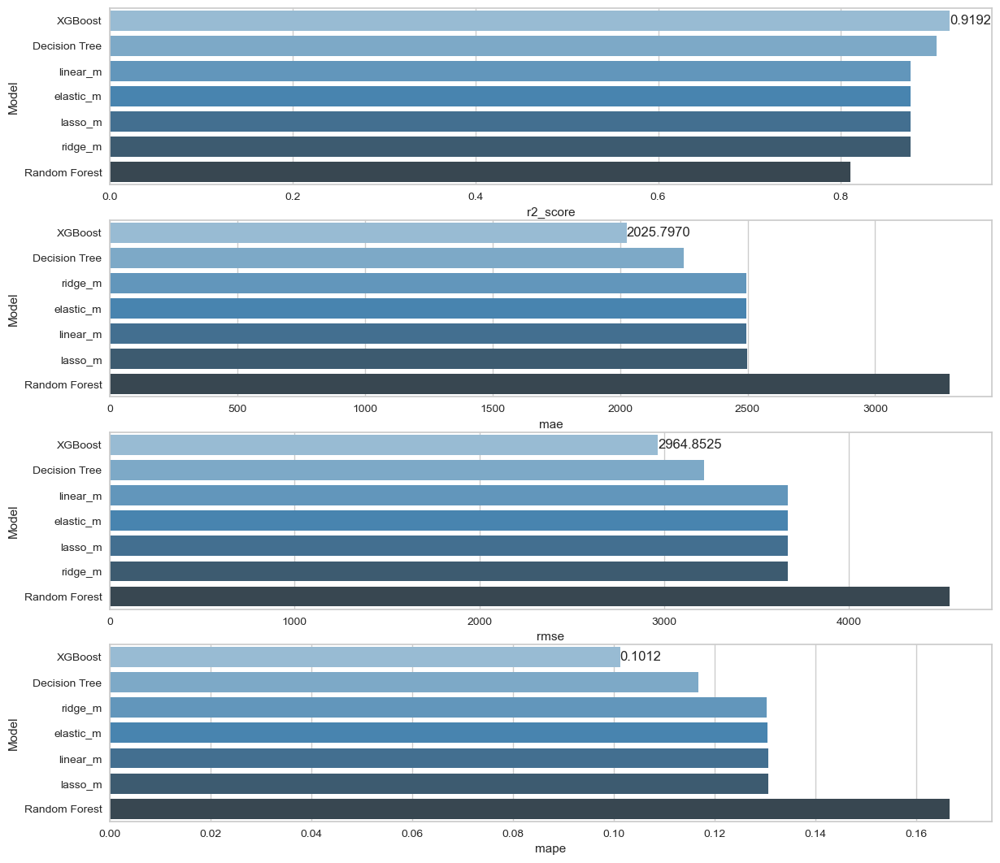

In [609]:
plt.figure(figsize=(14,13))

plt.subplot(411)
compare = compare.sort_values(by="r2_score", ascending=False)
ax=sns.barplot(x="r2_score", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0],fmt="%.4f")

plt.subplot(412)
compare = compare.sort_values(by="mae", ascending=True)
ax=sns.barplot(x="mae", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0],fmt="%.4f")

plt.subplot(413)
compare = compare.sort_values(by="rmse", ascending=True)
ax=sns.barplot(x="rmse", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0],fmt="%.4f")

plt.subplot(414)
compare = compare.sort_values(by="mape", ascending=True)
ax=sns.barplot(x="mape", y="Model", data=compare, palette="Blues_d")
ax.bar_label(ax.containers[0],fmt="%.4f")
plt.show()

## Feature İmportance

In [610]:
best_params_xgb = {key.replace('XGB_model__', ''): value for key, 
                   value in xgb_grid_model.best_params_.items()}

In [611]:
cat_onehot  = ['make_model', 'body_type', 'warranty', 'gearbox', 'fuel_type', 'seller', 'drivetrain', 'full_service_history',
              'upholstery', 'energy_efficiency_class']

cat_ordinal = ['type', 'comfort_&_convenience_Package', 'entertainment_&_media_Package', 'safety_&_security_Package']
    
cat_for_type = ["Used", "Employee's car", "Demonstration", "Pre-registered"]
cat_for_comfort = ['Standard', 'Premium', 'Premium Plus']
cat_for_ent = ['Standard', 'Plus']
cat_for_safety = ['Safety Standard Package', 'Safety Premium Package', 'Safety Premium Plus Package']

In [612]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

column_trans = make_column_transformer(
                        (OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_onehot), 
                        (OrdinalEncoder(categories=[cat_for_type, 
                                                    cat_for_comfort, 
                                                    cat_for_ent, 
                                                    cat_for_safety]), cat_ordinal),
                         remainder='passthrough', 
                         verbose_feature_names_out=False) # MinMaxScaler()

column_trans=column_trans.set_output(transform="pandas")

In [613]:
operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("XGB_model", XGBRegressor(**best_params_xgb, random_state = 42))]

pipe_model = Pipeline(steps=operations)

pipe_model.fit(X_train, y_train)

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'body_type',
                                                   'warranty', 'gearbox',
                                                   'fuel_type', 'seller',
                                                   'drivetrain',
                                                   'full_service_history',
                                                   'upholstery',
                                                   'energy_efficiency_class']),
                                                 ('ordinalencoder',
                                                  OrdinalEncode...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=5, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=30, n_jobs=None,
                              num_parallel_tree=None, random_state=42, ...))])

In [615]:
features = pipe_model["OneHot_Ordinal_Encoder"].get_feature_names_out()
features

array(['make_model_Dacia Duster', 'make_model_Dacia Logan',
       'make_model_Dacia Sandero', 'make_model_Fiat 500',
       'make_model_Fiat 500C', 'make_model_Fiat 500X',
       'make_model_Fiat Panda', 'make_model_Fiat Tipo',
       'make_model_Ford Fiesta', 'make_model_Ford Focus',
       'make_model_Ford Kuga', 'make_model_Ford Mondeo',
       'make_model_Ford Mustang', 'make_model_Hyundai IONIQ',
       'make_model_Hyundai TUCSON', 'make_model_Hyundai i20',
       'make_model_Hyundai i30', 'make_model_Mercedes-Benz A 180',
       'make_model_Nissan 350Z', 'make_model_Nissan 370Z',
       'make_model_Nissan Juke', 'make_model_Nissan Micra',
       'make_model_Nissan Pulsar', 'make_model_Nissan Qashqai',
       'make_model_Nissan X-Trail', 'make_model_Opel Adam',
       'make_model_Opel Astra', 'make_model_Opel Cascada',
       'make_model_Opel Corsa', 'make_model_Opel Grandland X',
       'make_model_Opel Insignia', 'make_model_Peugeot 2008',
       'make_model_Peugeot 206', 'make

In [616]:
imp_feats = pd.DataFrame(data=pipe_model["XGB_model"].feature_importances_,
                         columns=['xgb_Importance'],
                         index=features)

xgb_imp_feats = imp_feats.sort_values('xgb_Importance', ascending=False)
xgb_imp_feats

,xgb_Importance
power_kW,0.163
drivetrain_Front,0.152
gearbox_Automatic,0.098
age,0.097
gears,0.086
empty_weight,0.053
mileage,0.045
gearbox_Manual,0.019
engine_size,0.018
make_model_Peugeot 508,0.015


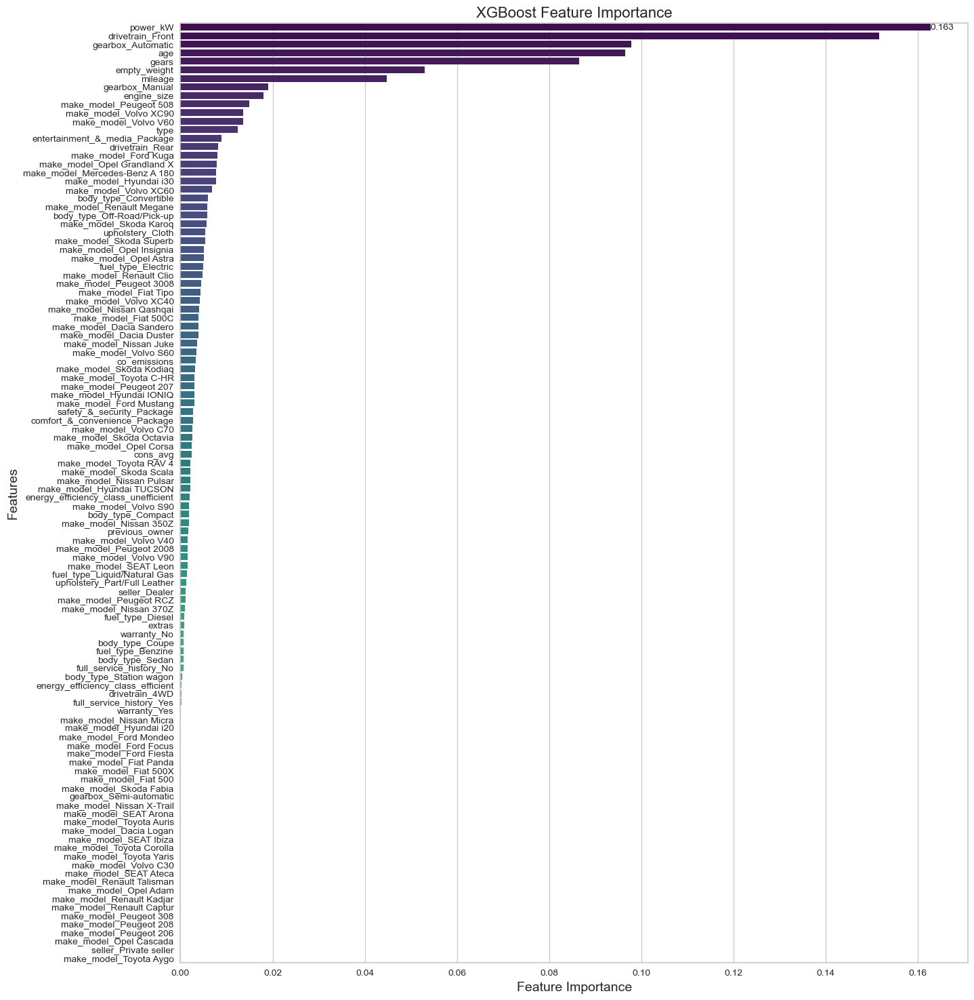

In [617]:
plt.figure(figsize=(15, 18))
ax = sns.barplot(x='xgb_Importance', y=xgb_imp_feats.index, data=xgb_imp_feats, palette="viridis")
ax.bar_label(ax.containers[0], fmt="%.3f", fontsize=10)
plt.title("XGBoost Feature Importance", fontsize=16)
plt.xlabel("Feature Importance", fontsize=14)
plt.ylabel("Features", fontsize=14)
plt.show()

## Feature Selection

In [108]:
df_new = df[["make_model", "power_kW", "age", "mileage",
            "gearbox", "gears", "fuel_type", "price"]]

In [109]:
df_new.head()

,make_model,power_kW,age,mileage,gearbox,gears,fuel_type,price
0,Mercedes-Benz A 45 AMG,310.000,2.000,18900.000,Automatic,8.000,Benzine,69900.000
1,Mercedes-Benz A 35 AMG,225.000,2.000,18995.000,Automatic,7.000,Benzine,46990.000
2,Mercedes-Benz A 45 AMG,100.000,7.000,197000.000,Automatic,7.000,Diesel,16800.000
3,Mercedes-Benz CLA 180,90.000,4.000,83339.000,Manual,7.000,Diesel,22550.000
4,Mercedes-Benz A 220,140.000,3.000,48900.000,Automatic,7.000,Benzine,26900.000


In [110]:
df_new.to_csv("rf_data.csv", index = False)

In [111]:
X= df_new.drop(columns="price")
y= df_new.price

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

## Converting Object Features into Numerical Features Using Make Column Transformer

In [113]:
df_new.select_dtypes(include="object").head(1)

,make_model,gearbox,fuel_type
0,Mercedes-Benz A 45 AMG,Automatic,Benzine


In [114]:
cat_onehot  = ['make_model','gearbox', 'fuel_type']

In [115]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

column_trans = make_column_transformer(
                        (OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_onehot), 
                         remainder='passthrough', 
                         verbose_feature_names_out=False) 

column_trans=column_trans.set_output(transform="pandas")

In [116]:
from sklearn.ensemble import RandomForestRegressor

operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("RF_model", RandomForestRegressor(random_state = 42))]

rf_model = Pipeline(steps=operations)

rf_model.fit(X_train, y_train)

Pipeline(steps=[('OneHot_Ordinal_Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['make_model', 'gearbox',
                                                   'fuel_type'])],
                                   verbose_feature_names_out=False)),
                ('RF_model', RandomForestRegressor(random_state=42))])

In [117]:
train_val(rf_model, X_train, y_train, X_test, y_test)

,train,test
R2,0.988,0.923
mae,785.210,2083.523
mse,1621583.304,10611610.817
rmse,1273.414,3257.547
mape,0.036,0.094


## Cross Validation

In [118]:
from sklearn.model_selection import cross_validate

operations = [("OneHot_Ordinal_Encoder", column_trans), 
              ("RF_model", RandomForestRegressor(random_state = 42))]

model = Pipeline(steps=operations)

scores = cross_validate(model,
                        X_train,
                        y_train,
                        scoring=['r2',
                                 'neg_mean_absolute_error',
                                 'neg_mean_squared_error',
                                 'neg_root_mean_squared_error',
                                 'neg_mean_absolute_percentage_error'],
                        cv =10,
                        return_train_score=True)
df_scores = pd.DataFrame(scores)
df_scores.mean()[2:]

test_r2                                            0.919
train_r2                                           0.988
test_neg_mean_absolute_error                   -2089.855
train_neg_mean_absolute_error                   -791.410
test_neg_mean_squared_error                -11037010.678
train_neg_mean_squared_error                -1632908.015
test_neg_root_mean_squared_error               -3318.156
train_neg_root_mean_squared_error              -1277.811
test_neg_mean_absolute_percentage_error           -0.096
train_neg_mean_absolute_percentage_error          -0.036
dtype: float64

## Prediction

In [130]:
import pickle
filename = 'my_rf_model'
pickle.dump(rf_model, open(filename, 'wb'))

In [131]:
rf_model = pickle.load(open('my_rf_model', 'rb'))

In [132]:
columns=list(df_new.columns)
columns

['make_model',
 'power_kW',
 'age',
 'mileage',
 'gearbox',
 'gears',
 'fuel_type',
 'price']

In [133]:
rf_predict = df_new.drop("price", axis =1).mean(numeric_only = True)
rf_predict

power_kW     113.552
age            4.104
mileage    56141.868
gears          5.830
dtype: float64

In [134]:
df_new.select_dtypes(include = 'object').columns

Index(['make_model', 'gearbox', 'fuel_type'], dtype='object')

In [135]:
rf_predict["make_model"] = "Nissan Juke"
rf_predict["gearbox"] = "Automatic"
rf_predict["fuel_type"] = "Benzine"

In [136]:
rf_predict = pd.DataFrame(rf_predict).T
rf_predict

,power_kW,age,mileage,gears,make_model,gearbox,fuel_type
0,113.552,4.104,56141.868,5.830,Nissan Juke,Automatic,Benzine


In [137]:
categorical_columns = df_new.select_dtypes(include="object").columns

rf_predict[categorical_columns] = rf_predict[categorical_columns].astype('category')

numeric_columns = df_new.drop("price", axis =1).select_dtypes(exclude=["object", "category"]).columns
rf_predict[numeric_columns] = rf_predict[numeric_columns].astype(float)

print(rf_predict.dtypes)

power_kW       float64
age            float64
mileage        float64
gears          float64
make_model    category
gearbox       category
fuel_type     category
dtype: object


In [138]:
rf_predict.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   power_kW    1 non-null      float64 
 1   age         1 non-null      float64 
 2   mileage     1 non-null      float64 
 3   gears       1 non-null      float64 
 4   make_model  1 non-null      category
 5   gearbox     1 non-null      category
 6   fuel_type   1 non-null      category
dtypes: category(3), float64(4)
memory usage: 515.0 bytes


In [139]:
rf_model.predict(rf_predict)

array([23190.49666667])

In [140]:
df.make_model.unique()

array(['Mercedes-Benz A 45 AMG', 'Mercedes-Benz A 35 AMG',
       'Mercedes-Benz CLA 180', 'Mercedes-Benz A 220',
       'Mercedes-Benz A 200', 'Mercedes-Benz A 250',
       'Mercedes-Benz A 180', 'Mercedes-Benz GLC 220',
       'Mercedes-Benz E 220', 'Mercedes-Benz CL', 'Mercedes-Benz E 350',
       'Mercedes-Benz CLA 200', 'Mercedes-Benz SLK 200',
       'Mercedes-Benz E 400', 'Mercedes-Benz C 400',
       'Mercedes-Benz C 43 AMG', 'Mercedes-Benz C 300',
       'Mercedes-Benz E 300', 'Mercedes-Benz C 63 AMG',
       'Mercedes-Benz C 200', 'Mercedes-Benz E 200',
       'Mercedes-Benz C 180', 'Mercedes-Benz C 250',
       'Mercedes-Benz C 220', 'Mercedes-Benz E 250',
       'Mercedes-Benz S 500', 'Mercedes-Benz CLA 45 AMG',
       'Mercedes-Benz CLS 350', 'Mercedes-Benz GLC 43 AMG',
       'Mercedes-Benz E 53 AMG', 'Mercedes-Benz GLC 250',
       'Mercedes-Benz GLC 300', 'Mercedes-Benz GLC 63 AMG',
       'Mercedes-Benz E 63 AMG', 'Opel Astra', 'Opel Corsa', 'Opel Adam',
       'Opel I